###### Nigel K. Gondo: Data Warrior Analytics
###### Exploring the Link Between Income Inequality and Human Development: Insights from BRICS and G7 Nations
###### Happy Analyzing

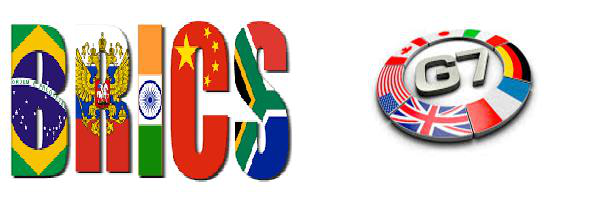

In [40]:
from PIL import Image
Image.open('collage_image.jpg')

# 1. Project summary

Income inequality is a significant issue that leads to uneven access to essential resources and opportunities. This disparity impacts human development in various ways:

- **Limited Access to Quality Education and Healthcare:** Inequality restricts access to essential services.

- **Reduced Economic Growth:** High inequality can slow down economic progress.

- **Social Instability:** Disparities can lead to social unrest and instability.

As income inequality rises, it often results in:

- Poorer health outcomes.

- Lower educational attainment.

- Decline in overall well-being for disadvantaged populations.

Addressing income inequality is crucial for fostering equitable and sustainable human development. This project will examine:

- **Two Groups of Nations:**

    - Developing and emerging market economies (specifically the BRICS nations).

    - Developed economies (specifically G7 nations).

By comparing these groups, we can observe how income inequality develops. The purpose of this project is to:

- Understand the extent of the relationship between income inequality and human development.

- Analyze the share of income for the top 1%, the top 10%, and the bottom 50%.

The project methodology includes:

- Data cleaning.

- Conducting descriptive statistics and exploratory data analysis (EDA).

- Performing correlation analysis using Spearman rank correlation to test the relationship between income inequality and the Human Development Index (HDI).

- Providing conclusions based on the findings.

The data has been sourced from the World Inequality Database (WID) [https://wid.world/] and covers the period from 1990 to 2022.

# 2. Importing relevant libraries

In [41]:
#importing relevant libraries
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_style('white')
plt.rcParams.update({'figure.figsize':(10,8), 'figure.dpi':100})
import warnings
warnings.filterwarnings('ignore')
from tabulate import tabulate

# 3. Importing and cleaning data


**Summary of section**

This section is dedicated to data-wrangling activities, including:

- Importing various Excel and CSV files containing data on income share, Gini coefficient, and HDI variables.

- Cleaning columns and handling missing values.

- Merging the different dataframes into a unified dataset.

## 3.1. Importing and cleaning share of income data 

In [42]:
#importing excel file
df_share_of_income = pd.read_excel('Share of income BRICS and G7.xls', sheet_name='Data')
df_share_of_income.head()

,Percentile,Year,sptinc_z_BR\nPre-tax national income \nTop 10% | share\nBrazil,sptinc_z_RU\nPre-tax national income \nTop 10% | share\nRussian Federation,sptinc_z_IN\nPre-tax national income \nTop 10% | share\nIndia,sptinc_z_CN\nPre-tax national income \nTop 10% | share\nChina,sptinc_z_ZA\nPre-tax national income \nTop 10% | share\nSouth Africa,sptinc_z_CA\nPre-tax national income \nTop 10% | share\nCanada,sptinc_z_FR\nPre-tax national income \nTop 10% | share\nFrance,sptinc_z_DE\nPre-tax national income \nTop 10% | share\nGermany,sptinc_z_IT\nPre-tax national income \nTop 10% | share\nItaly,sptinc_z_JP\nPre-tax national income \nTop 10% | share\nJapan,sptinc_z_GB\nPre-tax national income \nTop 10% | share\nUnited Kingdom,sptinc_z_US\nPre-tax national income \nTop 10% | share\nUSA
0,p90p100,1990,0.5859,0.2395,0.3440,0.3085,0.4718,0.3161,0.3156,0.3437,0.3152,0.2418,0.3291,0.3876
1,p90p100,1991,0.5859,0.2501,0.3502,0.3151,0.4919,0.3180,0.3107,0.3318,0.3145,0.2330,0.3356,0.3832
2,p90p100,1992,0.5859,0.3245,0.3599,0.3271,0.4879,0.3183,0.3077,0.3256,0.3173,0.2034,0.3363,0.3941
3,p90p100,1993,0.5859,0.3421,0.3767,0.3391,0.4635,0.3251,0.3065,0.3185,0.3233,0.2071,0.3423,0.3910
4,p90p100,1994,0.5859,0.4029,0.3922,0.3433,0.4739,0.3268,0.3120,0.3149,0.3275,0.2097,0.3504,0.3913


In [43]:
#checking if there are changes that need to be done to column names
df_share_of_income.columns

Index(['Percentile ', 'Year ',
       'sptinc_z_BR\nPre-tax national income \nTop 10% | share\nBrazil',
       'sptinc_z_RU\nPre-tax national income \nTop 10% | share\nRussian Federation',
       'sptinc_z_IN\nPre-tax national income \nTop 10% | share\nIndia',
       'sptinc_z_CN\nPre-tax national income \nTop 10% | share\nChina',
       'sptinc_z_ZA\nPre-tax national income \nTop 10% | share\nSouth Africa',
       'sptinc_z_CA\nPre-tax national income \nTop 10% | share\nCanada',
       'sptinc_z_FR\nPre-tax national income \nTop 10% | share\nFrance',
       'sptinc_z_DE\nPre-tax national income \nTop 10% | share\nGermany',
       'sptinc_z_IT\nPre-tax national income \nTop 10% | share\nItaly',
       'sptinc_z_JP\nPre-tax national income \nTop 10% | share\nJapan',
       'sptinc_z_GB\nPre-tax national income \nTop 10% | share\nUnited Kingdom',
       'sptinc_z_US\nPre-tax national income \nTop 10% | share\nUSA'],
      dtype='object')

In [44]:
#removing any trailing spacing on the column names
df_share_of_income.rename(columns=lambda x: x.strip(), inplace=True)
df_share_of_income.columns

Index(['Percentile', 'Year',
       'sptinc_z_BR\nPre-tax national income \nTop 10% | share\nBrazil',
       'sptinc_z_RU\nPre-tax national income \nTop 10% | share\nRussian Federation',
       'sptinc_z_IN\nPre-tax national income \nTop 10% | share\nIndia',
       'sptinc_z_CN\nPre-tax national income \nTop 10% | share\nChina',
       'sptinc_z_ZA\nPre-tax national income \nTop 10% | share\nSouth Africa',
       'sptinc_z_CA\nPre-tax national income \nTop 10% | share\nCanada',
       'sptinc_z_FR\nPre-tax national income \nTop 10% | share\nFrance',
       'sptinc_z_DE\nPre-tax national income \nTop 10% | share\nGermany',
       'sptinc_z_IT\nPre-tax national income \nTop 10% | share\nItaly',
       'sptinc_z_JP\nPre-tax national income \nTop 10% | share\nJapan',
       'sptinc_z_GB\nPre-tax national income \nTop 10% | share\nUnited Kingdom',
       'sptinc_z_US\nPre-tax national income \nTop 10% | share\nUSA'],
      dtype='object')

In [45]:
#Changing the name of columns to just the name of the country to make them more clear
df_share_of_income.columns.values[[2,3,4,5,6,7,8,9,10,11,12,13]] = ['Brazil', 'Russian Federation','India',  
                                                                    'China','South Africa', 'Canada', 
                                                                    'France', 'Germany','Italy', 
                                                                    'Japan','United Kingdom', 'United States']
df_share_of_income.head()

,Percentile,Year,Brazil,Russian Federation,India,China,South Africa,Canada,France,Germany,Italy,Japan,United Kingdom,United States
0,p90p100,1990,0.5859,0.2395,0.3440,0.3085,0.4718,0.3161,0.3156,0.3437,0.3152,0.2418,0.3291,0.3876
1,p90p100,1991,0.5859,0.2501,0.3502,0.3151,0.4919,0.3180,0.3107,0.3318,0.3145,0.2330,0.3356,0.3832
2,p90p100,1992,0.5859,0.3245,0.3599,0.3271,0.4879,0.3183,0.3077,0.3256,0.3173,0.2034,0.3363,0.3941
3,p90p100,1993,0.5859,0.3421,0.3767,0.3391,0.4635,0.3251,0.3065,0.3185,0.3233,0.2071,0.3423,0.3910
4,p90p100,1994,0.5859,0.4029,0.3922,0.3433,0.4739,0.3268,0.3120,0.3149,0.3275,0.2097,0.3504,0.3913


In [46]:
#checking the percentile column values so that the values can be changed
df_share_of_income['Percentile'].unique()

array(['p90p100', 'p0p50', 'p99p100'], dtype=object)

In [47]:
#Changing the value names of percentile columns for easier clarification
#creating a dictionary for the values to be changed
value_replace = {'p90p100':'Top 10% share', 
                 'p0p50':'Bottom 50% share', 
                 'p99p100':'Top 1% share'}

#replacing values in percentile column
df_share_of_income['Percentile'] = df_share_of_income['Percentile'].replace(value_replace)

#checking that values have been replaced
df_share_of_income['Percentile'].unique()

array(['Top 10% share', 'Bottom 50% share', 'Top 1% share'], dtype=object)

In [48]:
#unpivoting dataframe so that countries are in one column

#list of columns to unpivot
values= list(df_share_of_income.columns[2:])

#unpivoting dataframe
df_share_of_income_2 = pd.melt(df_share_of_income, 
                               id_vars=['Percentile','Year'], 
                               value_vars=values, 
                               var_name='Country', 
                               value_name='Share of income')

#pivoting the percentile column so that income share has seperate columns
df_share_of_income_2 = df_share_of_income_2.pivot(index=['Year', 'Country'], 
                                                  columns='Percentile', 
                                                  values='Share of income').reset_index()

df_share_of_income_2.head()

Percentile,Year,Country,Bottom 50% share,Top 1% share,Top 10% share
0,1990,Brazil,0.0921,0.2215,0.5859
1,1990,Canada,0.1986,0.0927,0.3161
2,1990,China,0.2146,0.0821,0.3085
3,1990,France,0.2153,0.0897,0.3156
4,1990,Germany,0.2091,0.1171,0.3437


In [49]:
#checking for null values
df_share_of_income_2.isnull().sum() # no missing values present

Percentile
Year                0
Country             0
Bottom 50% share    0
Top 1% share        0
Top 10% share       0
dtype: int64

## 3.2. Importing and cleaning gini coefficient data


**Brief Description of the Gini Coefficient**

The Gini coefficient is a metric that measures income inequality within a population, with values ranging from 0 to 1. A value of 0 indicates perfect income equality, while a value of 1 signifies perfect income inequality. According to OurWorldinData ['https://ourworldindata.org/what-is-the-gini-coefficient'], a Gini coefficient of 0.5 or higher is considered high, whereas a value below 0.4 is generally deemed acceptable.

In [50]:
#importing csv file
df_gini_index = pd.read_csv('economic-inequality-gini-index.csv')
df_gini_index.head()

,Year,Country,Country Group,Gini coefficient
0,1990,Brazil,BRICS,0.604500
1,1991,Brazil,BRICS,NaN
2,1992,Brazil,BRICS,0.531017
3,1993,Brazil,BRICS,0.600656
4,1994,Brazil,BRICS,NaN


In [51]:
#checking for missing values
df_gini_index.isnull().sum()

Year                  0
Country               0
Country Group         0
Gini coefficient    125
dtype: int64

In [52]:
#creating a dataframe that summaries the percentage of missing values of the variables to be analysed

#creating list of countries and empty list
country_list = list(df_gini_index['Country'].unique())
series_list = []
n = 4

#creating a loop to iterate through each country creating a series of the summarised\
#missing data then creating a dataframe
for i in country_list:
    country_filter = list(df_gini_index\
                        .loc[(df_gini_index['Country']==i)]\
                        .isnull()\
                        .sum() / len(df_gini_index\
                                     .loc[(df_gini_index['Country']==i)])*100)
    for j in country_filter:
        series_list.append(j)
        sublists = [series_list[i:i+n] for i in range(0,len(series_list),n)]
        df_null_values_pct = pd.DataFrame(sublists)

In [53]:
df_null_values_pct

,0,1,2,3
0,0.0,0.0,0.0,12.121212
1,0.0,0.0,0.0,21.212121
2,0.0,0.0,0.0,66.666667
3,0.0,0.0,0.0,42.424242
4,0.0,0.0,0.0,81.818182
5,0.0,0.0,0.0,9.090909
6,0.0,0.0,0.0,18.181818
7,0.0,0.0,0.0,9.090909
8,0.0,0.0,0.0,24.242424
9,0.0,0.0,0.0,90.909091


In [54]:
#renaming the index and the columns of the dataframe
columns = list(df_gini_index\
               .loc[(df_gini_index['Country']=='Brazil')]\
               .isnull()\
               .sum()\
               .index)

df_null_values_pct.index = country_list
df_null_values_pct.columns = columns

df_null_values_pct

,Year,Country,Country Group,Gini coefficient
Brazil,0.0,0.0,0.0,12.121212
Russian Federation,0.0,0.0,0.0,21.212121
India,0.0,0.0,0.0,66.666667
China,0.0,0.0,0.0,42.424242
South Africa,0.0,0.0,0.0,81.818182
Canada,0.0,0.0,0.0,9.090909
France,0.0,0.0,0.0,18.181818
Germany,0.0,0.0,0.0,9.090909
Italy,0.0,0.0,0.0,24.242424
Japan,0.0,0.0,0.0,90.909091


In [55]:
#since gini cofficient does not drastically change will fill the missing values with the median
df_gini_index['Gini coefficient'] = df_gini_index.groupby('Country')['Gini coefficient']\
.transform(lambda x: x.fillna(x.median()))

#checking that missing values have been filled
df_gini_index.isnull().sum()

Year                0
Country             0
Country Group       0
Gini coefficient    0
dtype: int64

## 3.3. Importing and cleaning HDI data

In [56]:
#importing excel file
df_hdi_data = pd.read_excel('hdr-data.xlsx', sheet_name='Data')
df_hdi_data.head()

,countryIsoCode,country,indexCode,index,dimension,indicatorCode,indicator,year,value,note
0,BRA,Brazil,HDI,Human Development Index,NaN,eys,Expected Years of Schooling (years),1990,12.927,NaN
1,BRA,Brazil,HDI,Human Development Index,NaN,eys,Expected Years of Schooling (years),1991,12.971,NaN
2,BRA,Brazil,HDI,Human Development Index,NaN,eys,Expected Years of Schooling (years),1992,13.017,NaN
3,BRA,Brazil,HDI,Human Development Index,NaN,eys,Expected Years of Schooling (years),1993,13.062,NaN
4,BRA,Brazil,HDI,Human Development Index,NaN,eys,Expected Years of Schooling (years),1994,13.107,NaN


In [57]:
#dropping unnecessary columns and renaming columns
df_hdi_data=df_hdi_data.drop(columns=['countryIsoCode', 
                                      'indexCode', 
                                      'dimension', 
                                      'index',
                                      'indicatorCode',
                                      'note'])\
.rename(columns={'country':'Country',
                 'year':'Year'})

df_hdi_data.head()

,Country,indicator,Year,value
0,Brazil,Expected Years of Schooling (years),1990,12.927
1,Brazil,Expected Years of Schooling (years),1991,12.971
2,Brazil,Expected Years of Schooling (years),1992,13.017
3,Brazil,Expected Years of Schooling (years),1993,13.062
4,Brazil,Expected Years of Schooling (years),1994,13.107


In [58]:
#pivoting the indicator column
df_hdi_data_2 = df_hdi_data.pivot(index=['Country', 'Year'], 
                                  columns='indicator', 
                                  values='value')\
.reset_index()\
.drop(columns='HDI Rank')

df_hdi_data_2.head()

indicator,Country,Year,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years)
0,Brazil,1990,12.927,10130.856,0.620,65.985,3.685
1,Brazil,1991,12.971,10100.900,0.624,66.310,3.831
2,Brazil,1992,13.017,9914.315,0.627,66.708,3.977
3,Brazil,1993,13.062,10180.023,0.633,67.109,4.123
4,Brazil,1994,13.107,10454.402,0.638,67.568,4.269


In [59]:
#merging data of gini index, income share and HDI into one dataframe
df_inequality_final = df_gini_index.merge(df_share_of_income_2, 
                                          left_on=['Country', 'Year'],
                                          right_on=['Country', 'Year'])\
.merge(df_hdi_data_2,
       left_on=['Country', 'Year'],
       right_on=['Country', 'Year'])

df_inequality_final.head()

,Year,Country,Country Group,Gini coefficient,Bottom 50% share,Top 1% share,Top 10% share,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years)
0,1990,Brazil,BRICS,0.604500,0.0921,0.2215,0.5859,12.927,10130.856,0.620,65.985,3.685
1,1991,Brazil,BRICS,0.540374,0.0921,0.2215,0.5859,12.971,10100.900,0.624,66.310,3.831
2,1992,Brazil,BRICS,0.531017,0.0921,0.2215,0.5859,13.017,9914.315,0.627,66.708,3.977
3,1993,Brazil,BRICS,0.600656,0.0921,0.2215,0.5859,13.062,10180.023,0.633,67.109,4.123
4,1994,Brazil,BRICS,0.540374,0.0921,0.2215,0.5859,13.107,10454.402,0.638,67.568,4.269


In [60]:
#checking that dataframe is free of missing values
df_inequality_final.isnull().sum()

Year                                            0
Country                                         0
Country Group                                   0
Gini coefficient                                0
Bottom 50% share                                0
Top 1% share                                    0
Top 10% share                                   0
Expected Years of Schooling (years)             0
Gross National Income Per Capita (2017 PPP$)    0
Human Development Index (value)                 0
Life Expectancy at Birth (years)                0
Mean Years of Schooling (years)                 0
dtype: int64

In [61]:
# checking there are no duplicate values
df_inequality_final.duplicated().sum()

0

In [62]:
#checking that all columns are correct data types
df_inequality_final.dtypes

Year                                              int64
Country                                          object
Country Group                                    object
Gini coefficient                                float64
Bottom 50% share                                float64
Top 1% share                                    float64
Top 10% share                                   float64
Expected Years of Schooling (years)             float64
Gross National Income Per Capita (2017 PPP$)    float64
Human Development Index (value)                 float64
Life Expectancy at Birth (years)                float64
Mean Years of Schooling (years)                 float64
dtype: object

We will add an additional column called the Palma ratio to provide a different perspective on income inequality.

**What is the Palma Ratio?**

- The Palma ratio measures income inequality and focuses on two income groups: the top 10% and the bottom 40% of GNI. For this project, we will use the bottom 50%. This ratio highlights the disparity between society's richest and poorest sections. A higher Palma ratio indicates greater inequality, while a lower ratio suggests a more equitable income distribution.

In [63]:
#creating an extra column for palma ratio
df_inequality_final['Palma ratio'] = df_inequality_final['Top 10% share'] / df_inequality_final['Bottom 50% share']
df_inequality_final.head()

,Year,Country,Country Group,Gini coefficient,Bottom 50% share,Top 1% share,Top 10% share,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years),Palma ratio
0,1990,Brazil,BRICS,0.604500,0.0921,0.2215,0.5859,12.927,10130.856,0.620,65.985,3.685,6.361564
1,1991,Brazil,BRICS,0.540374,0.0921,0.2215,0.5859,12.971,10100.900,0.624,66.310,3.831,6.361564
2,1992,Brazil,BRICS,0.531017,0.0921,0.2215,0.5859,13.017,9914.315,0.627,66.708,3.977,6.361564
3,1993,Brazil,BRICS,0.600656,0.0921,0.2215,0.5859,13.062,10180.023,0.633,67.109,4.123,6.361564
4,1994,Brazil,BRICS,0.540374,0.0921,0.2215,0.5859,13.107,10454.402,0.638,67.568,4.269,6.361564


The dataset has been cleaned and is now prepared for further analysis.

# 4. Descriptive statistics

**Summary of section**

This section aims to present the descriptive statistics of the data, focusing on measures of central tendency, particularly the mean, and measures of variability, such as standard deviation, percentiles, and minimum and maximum values. 
The statistics will be divided into three parts: overall statistics for the entire dataset and statistics for each country group.

In [64]:
#statics for the whole dataset
df_inequality_final.describe()

,Year,Gini coefficient,Bottom 50% share,Top 1% share,Top 10% share,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years),Palma ratio
count,396.00000,396.000000,396.000000,396.000000,396.000000,396.000000,396.000000,396.000000,396.000000,396.000000,396.000000
mean,2006.00000,0.390688,0.169238,0.140454,0.410515,14.454596,29902.282131,0.795354,74.854265,10.049758,2.947564
std,9.53395,0.096611,0.048955,0.051531,0.105149,2.219092,17163.773520,0.129335,7.201942,3.046548,2.070871
min,1990.00000,0.279938,0.058000,0.044800,0.203400,8.017000,1425.257000,0.434000,53.980000,2.782000,0.697053
25%,1998.00000,0.328547,0.137575,0.103200,0.339750,13.426000,12959.824750,0.707500,69.940250,7.723250,1.740914
50%,2006.00000,0.349057,0.173050,0.129800,0.376500,15.218000,36438.527500,0.846500,77.356000,10.740000,2.120853
75%,2014.00000,0.403548,0.199125,0.186125,0.466275,15.945750,43217.800750,0.898250,80.516250,12.603250,3.344476
max,2022.00000,0.647621,0.291800,0.259000,0.654400,17.668000,65564.938000,0.951000,84.820000,14.256000,11.275862


In [65]:
#statistics of BRICS
df_inequality_final[df_inequality_final['Country Group']=='BRICS'].describe()

,Year,Gini coefficient,Bottom 50% share,Top 1% share,Top 10% share,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years),Palma ratio
count,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000,165.000000
mean,2006.000000,0.461668,0.133615,0.178496,0.498223,12.587673,11249.104042,0.666370,67.855182,7.605903,4.426762
std,9.550891,0.111357,0.042235,0.047115,0.097203,2.184157,6604.428933,0.098653,5.756311,2.797636,2.459149
min,1990.000000,0.315551,0.058000,0.074500,0.239500,8.017000,1425.257000,0.434000,53.980000,2.782000,0.844202
25%,1998.000000,0.370927,0.100800,0.140800,0.425300,11.545000,5349.577000,0.624000,63.950000,5.399000,2.720132
50%,2006.000000,0.398812,0.136400,0.193100,0.491700,13.245000,11249.389000,0.673000,68.409000,7.216000,3.584638
75%,2014.000000,0.577697,0.160000,0.221000,0.585900,14.108000,14212.858000,0.741000,72.365000,9.841000,5.826848
max,2022.000000,0.647621,0.283700,0.259000,0.654400,15.662000,27480.330000,0.839000,78.587000,12.412000,11.275862


In [66]:
#statistics of G7
df_inequality_final[df_inequality_final['Country Group']=='G7'].describe()


,Year,Gini coefficient,Bottom 50% share,Top 1% share,Top 10% share,Expected Years of Schooling (years),Gross National Income Per Capita (2017 PPP$),Human Development Index (value),Life Expectancy at Birth (years),Mean Years of Schooling (years),Palma ratio
count,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000,231.000000
mean,2006.000000,0.339989,0.194683,0.113281,0.347866,15.788113,43225.980766,0.887485,79.853610,11.795368,1.890993
std,9.542582,0.031492,0.035824,0.034610,0.052822,0.876969,6850.588649,0.036440,2.281606,1.736115,0.601755
min,1990.000000,0.279938,0.129500,0.044800,0.203400,12.963000,30657.903000,0.780000,75.359000,7.439000,0.697053
25%,1998.000000,0.321191,0.172100,0.094850,0.328300,15.299500,39089.088000,0.869000,78.062500,10.574500,1.618602
50%,2006.000000,0.331093,0.191900,0.112000,0.349700,15.846000,42685.481000,0.893000,79.826000,12.248000,1.849798
75%,2014.000000,0.350645,0.206100,0.130900,0.375050,16.379000,45960.140000,0.915500,81.744000,13.151000,2.104923
max,2022.000000,0.415335,0.291800,0.207300,0.468600,17.668000,65564.938000,0.951000,84.820000,14.256000,3.512744


# 5. Exploratory data analysis (EDA)

**Summary of section**

This section aims to conduct Exploratory Data Analysis (EDA) to better understand the data on income inequality, income share, and HDI. The analysis will involve:

- Conducting time series analysis.

- Examining the distribution of the data.

- Aggregating the mean and comparing it across countries and country groups.

- Analyzing the distribution of all variables.

- Conducting a Spearman Rank Correlation analysis to examine the relationship between income inequality and the HDI.

The goal is to gain comprehensive insights into these variables.

## 5.1. Time series analysis

### 5.1.1. Income Share Trends by Country (1990-2022)

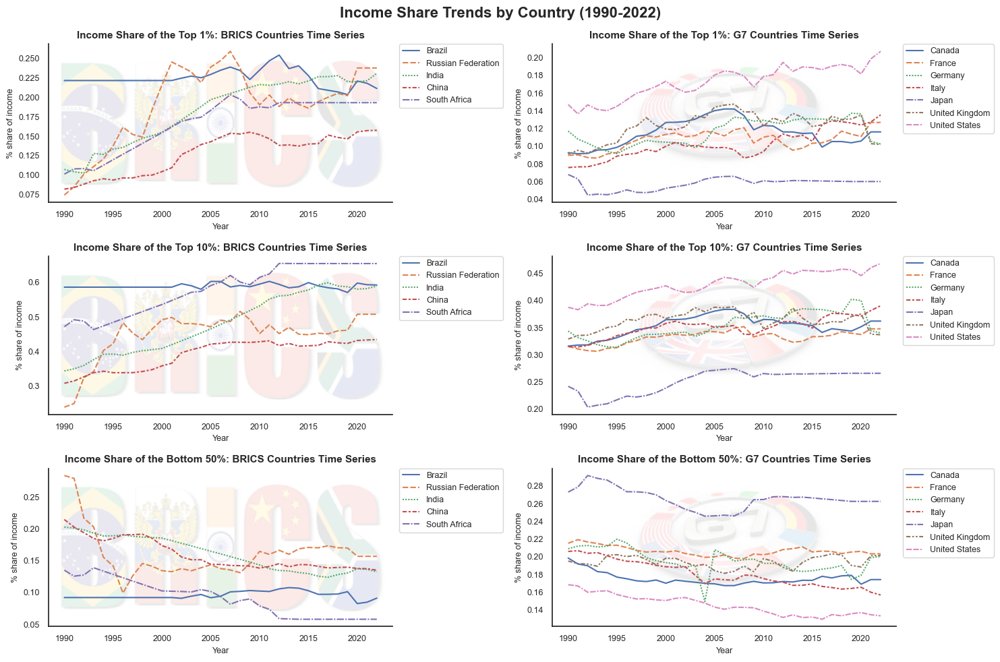

In [67]:
#creating filtered dataframes by country group
BRICS = df_inequality_final[df_inequality_final['Country Group']=='BRICS']
G7 = df_inequality_final[df_inequality_final['Country Group']=='G7']

#creating variable for the images to display as background on charts
brics_image = plt.imread('brics_logo.png')
g7_image = plt.imread('g7_logo.jpg')

#creating subplots
fig, ax = plt.subplots(3,2, figsize=(15,10))

#plotting line charts
#plotting BRICS top 1% share of income line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Top 1% share', 
             hue ='Country', 
             style='Country',
             ax=ax[0,0])
#setting title
ax[0,0].set_title('Income Share of the Top 1%: BRICS Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,0].set_xlabel('Year', 
                   fontsize=9)
ax[0,0].set_ylabel('% share of income', 
                   fontsize=9)
ax[0,0].tick_params(axis='x', 
                    labelsize=9)
ax[0,0].tick_params(axis='y', 
                    labelsize=9)
ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['right'].set_visible(False)
ax[0,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,0].imshow(brics_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

################################################################################################################

#plotting G7 top 1% share of income line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Top 1% share', 
             hue ='Country', 
             style='Country',
             ax=ax[0,1])
#setting title
ax[0,1].set_title('Income Share of the Top 1%: G7 Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,1].set_xlabel('Year', 
                   fontsize=9)
ax[0,1].set_ylabel('% share of income', 
                   fontsize=9)
ax[0,1].tick_params(axis='x', 
                    labelsize=9)
ax[0,1].tick_params(axis='y', 
                    labelsize=9)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['right'].set_visible(False)
ax[0,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,1].imshow(g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

#######################################################################################################################

#plotting BRICS top 10% share of income line chart
sns.lineplot(data=BRICS, 
             x='Year', 
             y='Top 10% share', 
             hue='Country', 
             style='Country',
             ax=ax[1,0])
#setting title
ax[1,0].set_title('Income Share of the Top 10%: BRICS Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,0].set_xlabel('Year', 
                   fontsize=9)
ax[1,0].set_ylabel('% share of income', 
                   fontsize=9)
ax[1,0].tick_params(axis='x', 
                    labelsize=9)
ax[1,0].tick_params(axis='y', 
                    labelsize=9)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['right'].set_visible(False)
ax[1,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,0].imshow(brics_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

#####################################################################################################################

#plotting G7 top 10% share of income line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Top 10% share', 
             hue='Country', 
             style='Country',
             ax=ax[1,1])
ax[1,1].set_title('Income Share of the Top 10%: G7 Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,1].set_xlabel('Year', 
                   fontsize=9)
ax[1,1].set_ylabel('% share of income', 
                   fontsize=9)
ax[1,1].tick_params(axis='x', 
                    labelsize=9)
ax[1,1].tick_params(axis='y', 
                    labelsize=9)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,1].imshow(g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

##########################################################################################################

#plotting BRICS bottom 50% share of income line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Bottom 50% share', 
             hue='Country', 
             style='Country',
             ax=ax[2,0])
ax[2,0].set_title('Income Share of the Bottom 50%: BRICS Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[2,0].set_xlabel('Year', 
                   fontsize=9)
ax[2,0].set_ylabel('% share of income', 
                   fontsize=9)
ax[2,0].tick_params(axis='x', 
                    labelsize=9)
ax[2,0].tick_params(axis='y', 
                    labelsize=9)
ax[2,0].spines['top'].set_visible(False)
ax[2,0].spines['right'].set_visible(False)
ax[2,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[2,0].imshow(brics_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

##########################################################################################################

#plotting G7 bottom 50% share of income line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Bottom 50% share', 
             hue='Country', 
             style='Country',
             ax=ax[2,1])
ax[2,1].set_title('Income Share of the Bottom 50%: G7 Countries Time Series',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[2,1].set_xlabel('Year', 
                   fontsize=9)
ax[2,1].set_ylabel('% share of income', 
                   fontsize=9)
ax[2,1].tick_params(axis='x', 
                    labelsize=9)
ax[2,1].tick_params(axis='y', 
                    labelsize=9)
ax[2,1].spines['top'].set_visible(False)
ax[2,1].spines['right'].set_visible(False)
ax[2,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[2,1].imshow(g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

#setting main title
plt.suptitle('Income Share Trends by Country (1990-2022)', 
             fontsize=16,
             fontweight='bold') 

#adjusting subplot spacing
plt.tight_layout()

plt.show()

**Key Takeaways**

1. **Top 1% Share of Income**

- **BRICS Nations:** From 1990 to the mid-2000s, Russia, India, and South Africa experienced a sharp increase in the top 1% share of income, while China saw moderate growth. Brazil's growth remained flat during this period. From the mid-2000s to 2022, growth was flat with minor fluctuations.

- **G7 Nations:** The UK showed a gradual upward trend in the top 1% share of income. Japan exhibited barely any growth, and the other G7 nations experienced fluctuations throughout the period.

2. **Top 10% Share of Income**

- **BRICS Nations:** India and South Africa had the sharpest growth in income share during the period. However, South Africa's growth flattened from the mid-2010s to 2022. Russia saw a sharp increase from 1990 to the mid-to-late 1990s, after which growth flattened with minor fluctuations. Brazil experienced flat growth with minor fluctuations throughout the period, and China exhibited a slow, gradual upward trend.

- **G7 Nations:** The trends in the top 10% share of income for G7 nations are similar to those for the top 1% share of income.

3. **Bottom 50% Share of Income**

- **BRICS Nations:** Since 1990, there has been a general downward trend in the share of income for the bottom 50%, with the exception of Brazil, where there hasn't been much change.

- **G7 Nations:** A similar downward trend can be observed in the G7 nations.


### 5.1.2. Income Share Trends by Country Group (1990-2022)

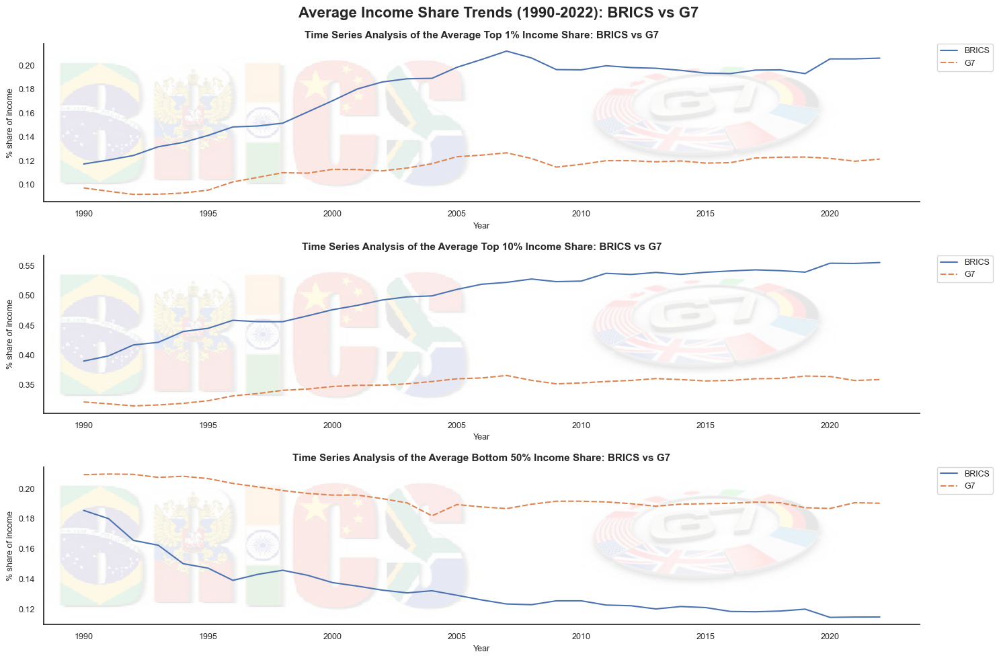

In [68]:
#creating a collage immage for background of chart
# Define the target size (width, height)
target_size = (300, 200) # Load images 
img1 = Image.open('brics_logo.png') 
img2 = Image.open('g7_logo.jpg') 
# Resize images 
img1 = img1.resize(target_size) 
img2 = img2.resize(target_size) 
# Create a new image with combined width 
total_width = img1.width + img2.width 
max_height = max(img1.height, img2.height)
collage_image = Image.new('RGB', (total_width, max_height)) 
# Paste images side by side 
collage_image.paste(img1, (0, 0)) 
collage_image.paste(img2, (img1.width, 0))
# Save the collage 
collage_image.save('collage_image.jpg')

#creating subplots
brics_g7_image = plt.imread('collage_image.jpg')

fig, ax = plt.subplots(3, figsize= (15,10))

#plotting line charts
#plotting BRICS top 1% share of income line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Top 1% share', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[0])
#setting title
ax[0].set_title('Time Series Analysis of the Average Top 1% Income Share: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[0].set_xlabel('Year', 
                 fontsize=9)
ax[0].set_ylabel('% share of income', 
                 fontsize=9)
ax[0].tick_params(axis='x', 
                 labelsize=9)
ax[0].tick_params(axis='y', 
                 labelsize=9)
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#####################################################################################################

#plotting BRICS top 10% share of income line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Top 10% share', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[1])
#setting title
ax[1].set_title('Time Series Analysis of the Average Top 10% Income Share: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[1].set_xlabel('Year', 
                 fontsize=9)
ax[1].set_ylabel('% share of income', 
                 fontsize=9)
ax[1].tick_params(axis='x', 
                  labelsize=9)
ax[1].tick_params(axis='y', 
                  labelsize=9)
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#################################################################################################################################

#plotting BRICS bottom 50% share of income line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Bottom 50% share', 
             hue='Country Group', 
             style='Country Group',
             ci=None,
             ax=ax[2])
#setting title
ax[2].set_title('Time Series Analysis of the Average Bottom 50% Income Share: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[2].set_xlabel('Year', 
                 fontsize=9)
ax[2].set_ylabel('% share of income', 
                 fontsize=9)
ax[2].tick_params(axis='x', 
                 labelsize=9)
ax[2].tick_params(axis='y', 
                 labelsize=9)
ax[2].spines['top'].set_visible(False)
ax[2].spines['right'].set_visible(False)
ax[2].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[2].imshow(brics_g7_image, 
             extent=ax[2].get_xlim() + ax[2].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#setting main title
plt.suptitle('Average Income Share Trends (1990-2022): BRICS vs G7', 
             fontsize=16,
             fontweight='bold') 

#adjuststing chart spacing
plt.tight_layout()

plt.show()


**Key Takeaways**

**Top 1% Share of Income**

- From 1990 to the mid-2000s, BRICS nations experienced a faster growth rate in the top 1% share of income compared to G7 nations. However, from the mid-2000s to 2022, growth has stabilized for both groups.

**Top 10% Share of Income**

- A similar trend is observed for the top 10% share of income, where BRICS nations showed faster growth over the period.

**Bottom 50% Share of Income**

- On average, BRICS nations experienced a sharp decline in the income share of the bottom 50%, whereas G7 nations saw only a slight decline.

### 5.1.3. Income Inequality Trends by Country (1990-2022): Gini Coefficient and Palma Ratio

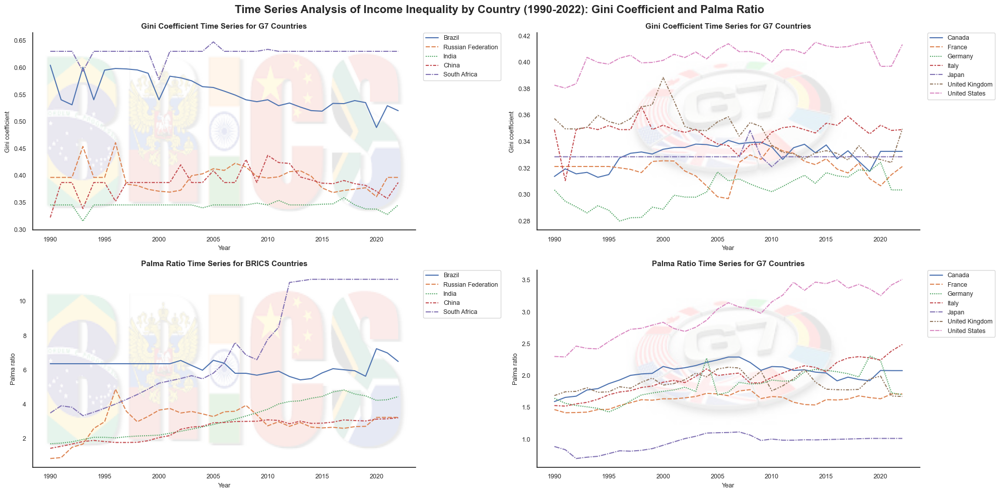

In [69]:
#Gini coefficient and Palma ratio trend

#creating subplots
fig, ax = plt.subplots(2,2, figsize= (20,10))

#plotting line charts
#plotting BRICS gini index line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Gini coefficient', 
             hue='Country', 
             style='Country',
             ax=ax[0,0])
#setting title
ax[0,0].set_title('Gini Coefficient Time Series for G7 Countries',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,0].set_xlabel('Year', 
                   fontsize=9)
ax[0,0].set_ylabel('Gini coefficient', 
                   fontsize=9)
ax[0,0].tick_params(axis='x', 
                    labelsize=9)
ax[0,0].tick_params(axis='y', 
                    labelsize=9)
ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['right'].set_visible(False)
ax[0,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,0].imshow(brics_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

################################################################################################################

#plotting G7 gini index line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Gini coefficient', 
             hue='Country', 
             style='Country',
             ax=ax[0,1])
#setting title
ax[0,1].set_title('Gini Coefficient Time Series for G7 Countries',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,1].set_xlabel('Year', 
                   fontsize=9)
ax[0,1].set_ylabel('Gini coefficient', 
                   fontsize=9)
ax[0,1].tick_params(axis='x', 
                    labelsize=9)
ax[0,1].tick_params(axis='y', 
                    labelsize=9)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['right'].set_visible(False)
ax[0,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,1].imshow(g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.1)

#########################################################################################################################

#plotting BRICS palma ratio line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Palma ratio', 
             hue='Country', 
             style='Country',
             ax=ax[1,0])
#setting title
ax[1,0].set_title('Palma Ratio Time Series for BRICS Countries',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,0].set_xlabel('Year', 
                   fontsize=9)
ax[1,0].set_ylabel('Palma ratio', 
                   fontsize=9)
ax[1,0].tick_params(axis='x', 
                    labelsize=9)
ax[1,0].tick_params(axis='y', 
                    labelsize=9)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['right'].set_visible(False)
ax[1,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,0].imshow(brics_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

###############################################################################################################################################

#plotting G7 palma ratio line chart
sns.lineplot(data=G7, 
             x='Year',
             y='Palma ratio', 
             hue ='Country', 
             style='Country',
             ax=ax[1,1])
#setting title
ax[1,1].set_title('Palma Ratio Time Series for G7 Countries',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,1].set_xlabel('Year', 
                   fontsize=9)
ax[1,1].set_ylabel('Palma ratio', 
                   fontsize=9)
ax[1,1].tick_params(axis='x', 
                    labelsize=9)
ax[1,1].tick_params(axis='y', 
                    labelsize=9)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,1].imshow(g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

#setting main title
plt.suptitle('Time Series Analysis of Income Inequality by Country (1990-2022): Gini Coefficient and Palma Ratio', 
             fontsize=16,
             fontweight='bold', 
             wrap=True) 

plt.tight_layout()


**Key Takeaways**

1. **Gini Coefficient**

- **BRICS Nations:** Brazil exhibits a noticeable downward trend from the early 2000s until 2022. South Africa and India show a flat trend, while Russia and China experience minor yearly fluctuations.

- **G7 Nations:** The US and Germany display a gradual upward trend over the period, whereas the rest of the G7 nations have a flat trend with slight year-to-year fluctuations.

2. **Palma Ratio**

- **BRICS Nations:** South Africa shows the fastest growth in the Palma ratio from 1990 until the mid-2010s, after which the growth flattens until 2022. India has a slow, gradual upward trend until 2022. Russia's growth was rapid from 1990 to the late 1990s, then leveled off. Brazil and China's growth trends have remained flat.

- **G7 Nations:** The US demonstrates the most significant upward trend throughout the period, while the rest of the G7 nations experience minor growth.

### 5.1.4. Income Inequality Trends by Country Group (1990-2022): Gini Coefficient and Palma Ratio

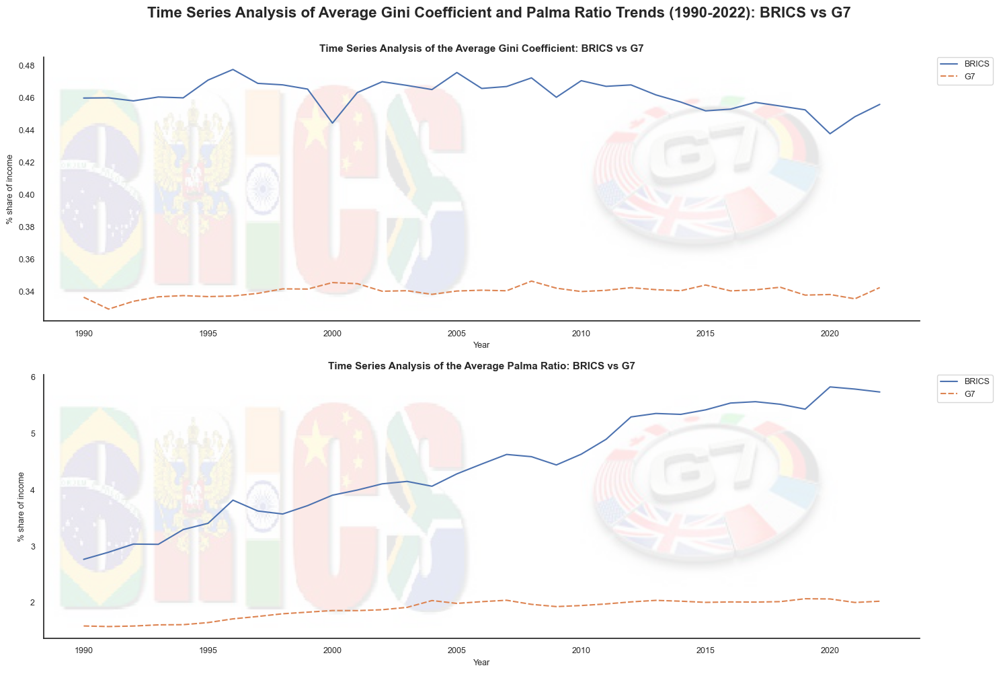

In [70]:
#creating subplots

fig, ax = plt.subplots(2, figsize= (15,10))

#plotting line charts
#plotting BRICS and G7 gini coefficient line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Gini coefficient', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[0])
#setting title
ax[0].set_title('Time Series Analysis of the Average Gini Coefficient: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[0].set_xlabel('Year', 
                 fontsize=9)
ax[0].set_ylabel('% share of income', 
                 fontsize=9)
ax[0].tick_params(axis='x', 
                 labelsize=9)
ax[0].tick_params(axis='y', 
                  labelsize=9)
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#####################################################################################################

#plotting BRICS and G7 palma ratio line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Palma ratio', 
             hue='Country Group', 
             style='Country Group',
             ci=None,
             ax=ax[1])
#setting title
ax[1].set_title('Time Series Analysis of the Average Palma Ratio: BRICS vs G7',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1].set_xlabel('Year', 
                   fontsize=9)
ax[1].set_ylabel('% share of income', 
                   fontsize=9)
ax[1].tick_params(axis='x', 
                    labelsize=9)
ax[1].tick_params(axis='y', 
                    labelsize=9)
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#setting main title
plt.suptitle('Time Series Analysis of Average Gini Coefficient and Palma Ratio Trends (1990-2022): BRICS vs G7', 
             fontsize=16,
             fontweight='bold',
             y=1) 

#adjuststing chart spacing
plt.tight_layout()

**Key Takeaways**

1. **Gini Coefficient**

- **BRICS Nations:** From 1990 to 2010, there were yearly fluctuations, but from 2010 to 2022, a gradual downward trend is observed.

- **G7 Nations:** The Gini coefficient has remained relatively constant throughout the period.

2. **Palma Ratio**

- **BRICS Nations:** There has been a general upward trend, indicating increased inequality between the top 10% and the bottom 50%.

- **G7 Nations:** The Palma ratio has shown minor growth, but nothing significant over the period.

### 5.1.5 HDI Variables Trend Analysis by Country (1990-2022)

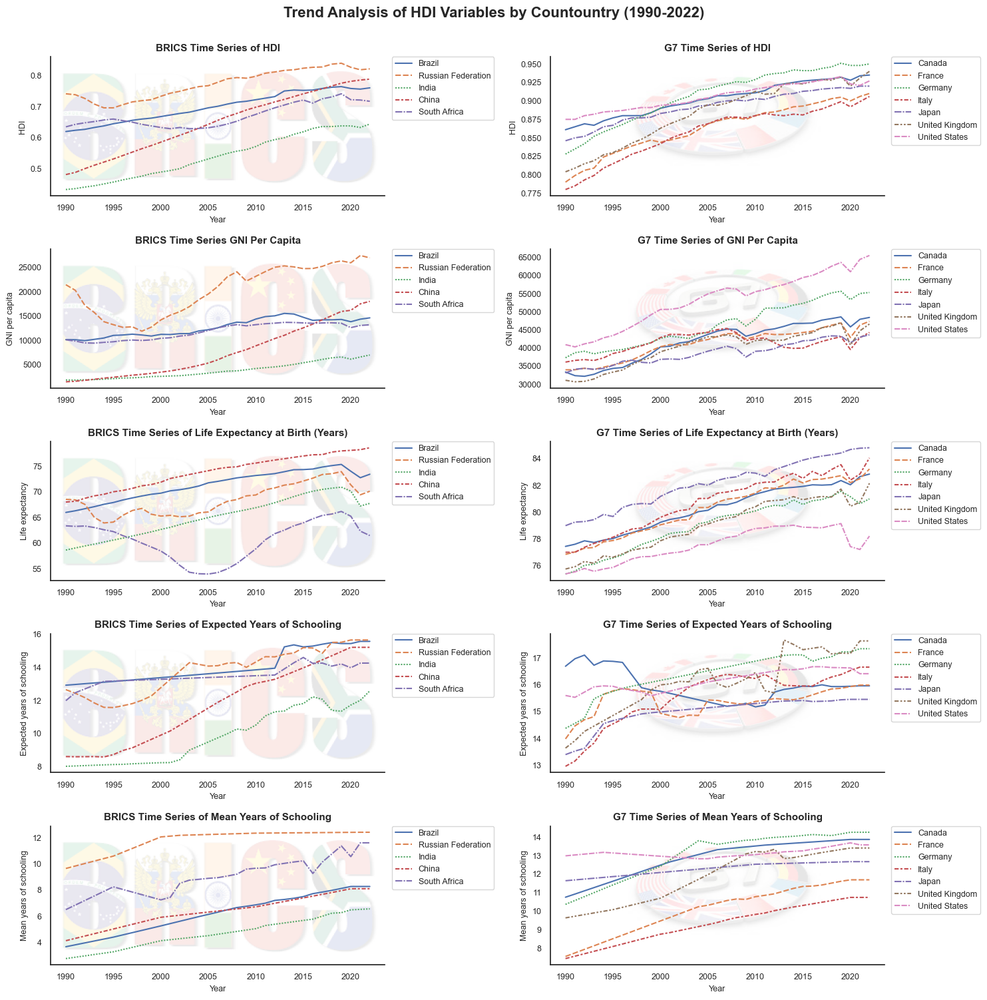

In [71]:
#creating subplots
fig, ax = plt.subplots(5,2, figsize= (15,15))

#plotting line charts
#plotting BRICS HDI line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Human Development Index (value)', 
             hue='Country', 
             style='Country',
             ax=ax[0,0])
#setting title
ax[0,0].set_title('BRICS Time Series of HDI',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,0].set_xlabel('Year', 
                   fontsize=9)
ax[0,0].set_ylabel('HDI', 
                   fontsize=9)
ax[0,0].tick_params(axis='x', 
                    labelsize=9)
ax[0,0].tick_params(axis='y', 
                    labelsize=9)
ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['right'].set_visible(False)
ax[0,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,0].imshow(brics_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

################################################################################################################

#plotting G7 HDI line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Human Development Index (value)', 
             hue ='Country', 
             style='Country',
             ax=ax[0,1])
#setting title
ax[0,1].set_title('G7 Time Series of HDI',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[0,1].set_xlabel('Year', 
                   fontsize=9)
ax[0,1].set_ylabel('HDI', 
                   fontsize=9)
ax[0,1].tick_params(axis='x', 
                    labelsize=9)
ax[0,1].tick_params(axis='y', 
                    labelsize=9)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['right'].set_visible(False)
ax[0,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[0,1].imshow(g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

#######################################################################################################################

#plotting BRICS GNI per capita line chart
sns.lineplot(data=BRICS, 
             x='Year', 
             y='Gross National Income Per Capita (2017 PPP$)',
             hue='Country',
             style='Country',
             ax=ax[1,0])
#setting title
ax[1,0].set_title('BRICS Time Series GNI Per Capita',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,0].set_xlabel('Year', 
                   fontsize=9)
ax[1,0].set_ylabel('GNI per capita', 
                   fontsize=9)
ax[1,0].tick_params(axis='x', 
                    labelsize=9)
ax[1,0].tick_params(axis='y', 
                    labelsize=9)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['right'].set_visible(False)
ax[1,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,0].imshow(brics_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

###############################################################################################

#plotting G7 GNI per capita line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Gross National Income Per Capita (2017 PPP$)', 
             hue ='Country', 
             style='Country',
             ax=ax[1,1])
ax[1,1].set_title('G7 Time Series of GNI Per Capita',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[1,1].set_xlabel('Year', 
                   fontsize=9)
ax[1,1].set_ylabel('GNI per capita', 
                   fontsize=9)
ax[1,1].tick_params(axis='x', 
                    labelsize=9)
ax[1,1].tick_params(axis='y', 
                    labelsize=9)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[1,1].imshow(g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

##########################################################################################################

#plotting BRICS life expectancy line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Life Expectancy at Birth (years)', 
             hue='Country', 
             style='Country',
             ax=ax[2,0])
ax[2,0].set_title('BRICS Time Series of Life Expectancy at Birth (Years)',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[2,0].set_xlabel('Year', 
                   fontsize=9)
ax[2,0].set_ylabel('Life expectancy', 
                   fontsize=9)
ax[2,0].tick_params(axis='x', 
                    labelsize=9)
ax[2,0].tick_params(axis='y', 
                    labelsize=9)
ax[2,0].spines['top'].set_visible(False)
ax[2,0].spines['right'].set_visible(False)
ax[2,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[2,0].imshow(brics_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

##########################################################################################################

#plotting G7 life expectancy line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Life Expectancy at Birth (years)', 
             hue='Country', 
             style='Country',
             ax=ax[2,1])
ax[2,1].set_title('G7 Time Series of Life Expectancy at Birth (Years)',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[2,1].set_xlabel('Year', 
                   fontsize=9)
ax[2,1].set_ylabel('Life expectancy', 
                   fontsize=9)
ax[2,1].tick_params(axis='x', 
                    labelsize=9)
ax[2,1].tick_params(axis='y', 
                    labelsize=9)
ax[2,1].spines['top'].set_visible(False)
ax[2,1].spines['right'].set_visible(False)
ax[2,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[2,1].imshow(g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)


##########################################################################################################

#plotting BRICS expected years of schooling line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Expected Years of Schooling (years)', 
             hue='Country', 
             style='Country',
             ax=ax[3,0])
ax[3,0].set_title('BRICS Time Series of Expected Years of Schooling',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[3,0].set_xlabel('Year', 
                   fontsize=9)
ax[3,0].set_ylabel('Expected years of schooling', 
                   fontsize=9)
ax[3,0].tick_params(axis='x', 
                    labelsize=9)
ax[3,0].tick_params(axis='y', 
                    labelsize=9)
ax[3,0].spines['top'].set_visible(False)
ax[3,0].spines['right'].set_visible(False)
ax[3,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[3,0].imshow(brics_image, 
               extent=ax[3,0].get_xlim() + ax[3,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

##########################################################################################################

#plotting G7 expected years of schooling line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Expected Years of Schooling (years)', 
             hue='Country', 
             style='Country',
             ax=ax[3,1])
ax[3,1].set_title('G7 Time Series of Expected Years of Schooling',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[3,1].set_xlabel('Year', 
                   fontsize=9)
ax[3,1].set_ylabel('Expected years of schooling', 
                   fontsize=9)
ax[3,1].tick_params(axis='x', 
                    labelsize=9)
ax[3,1].tick_params(axis='y', 
                    labelsize=9)
ax[3,1].spines['top'].set_visible(False)
ax[3,1].spines['right'].set_visible(False)
ax[3,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[3,1].imshow(g7_image, 
               extent=ax[3,1].get_xlim() + ax[3,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)


##########################################################################################################

#plotting BRICS mean years of schooling line chart
sns.lineplot(data=BRICS, 
             x='Year',
             y='Mean Years of Schooling (years)', 
             hue='Country', 
             style='Country',
             ax=ax[4,0])
ax[4,0].set_title('BRICS Time Series of Mean Years of Schooling',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[4,0].set_xlabel('Year', 
                   fontsize=9)
ax[4,0].set_ylabel('Mean years of schooling', 
                   fontsize=9)
ax[4,0].tick_params(axis='x', 
                    labelsize=9)
ax[4,0].tick_params(axis='y', 
                    labelsize=9)
ax[4,0].spines['top'].set_visible(False)
ax[4,0].spines['right'].set_visible(False)
ax[4,0].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[4,0].imshow(brics_image, 
               extent=ax[4,0].get_xlim() + ax[4,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)

##########################################################################################################

#plotting G7 mean years of schooling line chart
sns.lineplot(data=G7, 
             x='Year', 
             y='Mean Years of Schooling (years)', 
             hue='Country', 
             style='Country',
             ax=ax[4,1])
ax[4,1].set_title('G7 Time Series of Mean Years of Schooling',
                  fontweight='bold',
                  fontsize=11,
                  wrap=True)
#adjusting axis labels, ticks and legend
ax[4,1].set_xlabel('Year', 
                   fontsize=9)
ax[4,1].set_ylabel('Mean years of schooling', 
                   fontsize=9)
ax[4,1].tick_params(axis='x', 
                    labelsize=9)
ax[4,1].tick_params(axis='y', 
                    labelsize=9)
ax[4,1].spines['top'].set_visible(False)
ax[4,1].spines['right'].set_visible(False)
ax[4,1].legend(bbox_to_anchor=(1.02, 1),
               loc='upper left', 
               borderaxespad=0,
               fontsize=9)
#display the background image
ax[4,1].imshow(g7_image, 
               extent=ax[4,1].get_xlim() + ax[4,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.1)
            
#setting main title
plt.suptitle('Trend Analysis of HDI Variables by Countountry (1990-2022)', 
             fontsize=16,
             fontweight='bold', 
             y=1) 

#adjusting subplot spacing
plt.tight_layout()

plt.show()

**Key Takeaways**

1. **HDI**
- Among the BRICS nations, China has experienced the most significant growth in human development over the entire period. Brazil, India, and Russia also show a general upward trend, but not as rapid as China's. In contrast, South Africa has struggled with human development, showing a decline in HDI from the mid-1990s to the mid-2000s, followed by a slight improvement until 2022. The G7 nations all exhibit significant growth from 1990 to 2022.

2. **GNI per Capita** 
- For the BRICS nations, Russia and China have shown substantial growth in GNI per capita starting from the late 1990s until 2022. South Africa, Brazil, and India have exhibited only slight growth in GNI over this period, less significant than Russia and China. All G7 nations display a general upward trend in GNI per capita, with the United States and Germany showing the fastest growth.

3. **Life Expectancy**
- In the BRICS nations, there has been an upward trend in life expectancy from 1990 to 2020, followed by a slight dip post-2020, except for South Africa, which showed a decline from 1990 to the mid-2000s before improving. For the G7 nations, all countries exhibited an upward trajectory, with a dip in life expectancy post-2020 for the United States, Germany, France, United Kingdom, and Italy, while Canada and Japan did not decline.

4. **Expected Years of Schooling**
- For the BRICS nations, India, Russia, and China show a general upward trend in expected years of schooling over the period. Brazil and South Africa exhibit relatively flat trends, with Brazil showing a slight increase in the mid-2010s before flattening out again. All G7 nations show a general upward trend, except for Canada, which declined from 1990 to 2010, followed by a slight increase.

5. **Mean Years of Schooling**
- All BRICS nations exhibit a general upward trend in mean years of schooling. Similarly, the G7 nations also show an upward trend, although the United States and Japan have a flatter trajectory.

### 5.1.6. HDI Variable Trend Analysis by Country Group (1990-2022)

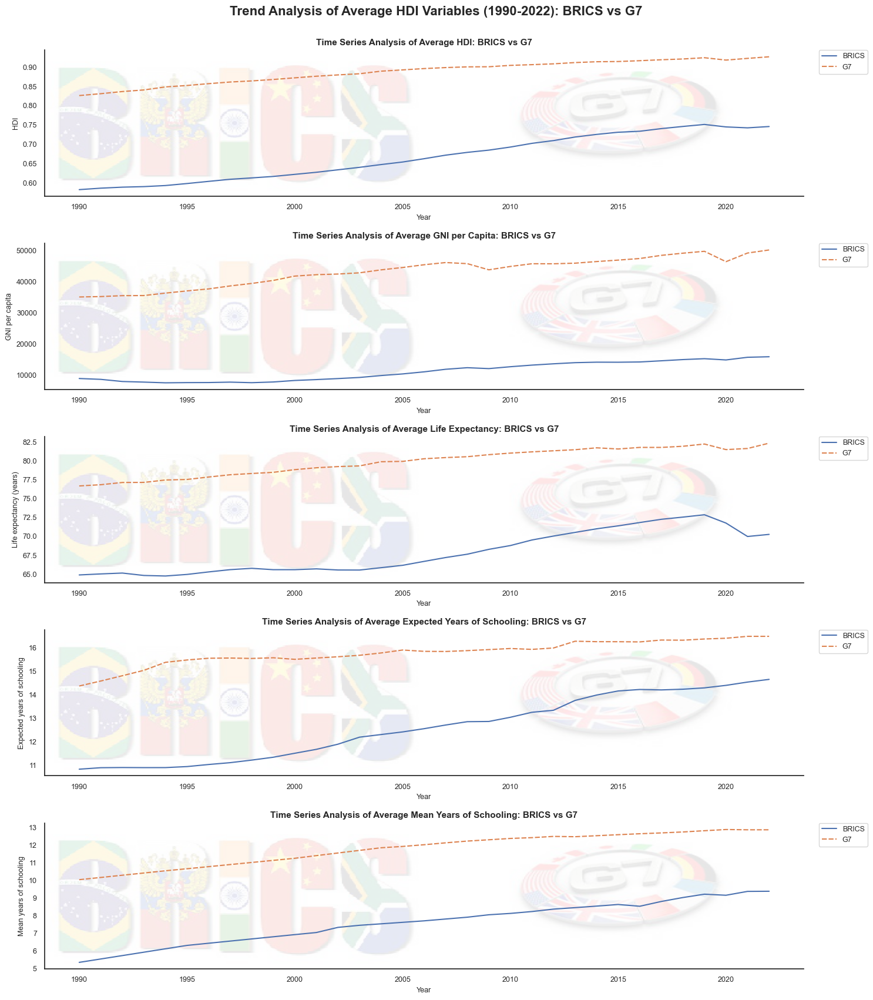

In [72]:
#creating subplots
fig, ax = plt.subplots(5, figsize= (15,17))

#plotting line charts
#plotting BRICS and G7 HDI line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Human Development Index (value)', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[0])
#setting title
ax[0].set_title('Time Series Analysis of Average HDI: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[0].set_xlabel('Year', 
                 fontsize=9)
ax[0].set_ylabel('HDI', 
                 fontsize=9)
ax[0].tick_params(axis='x', 
                 labelsize=9)
ax[0].tick_params(axis='y', 
                 labelsize=9)
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

####################################################################################################################################

#plotting BRICS and G7 GNI line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Gross National Income Per Capita (2017 PPP$)', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[1])
#setting title
ax[1].set_title('Time Series Analysis of Average GNI per Capita: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[1].set_xlabel('Year', 
                 fontsize=9)
ax[1].set_ylabel('GNI per capita', 
                 fontsize=9) 
ax[1].tick_params(axis='x', 
                  labelsize=9)
ax[1].tick_params(axis='y', 
                  labelsize=9)
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

############################################################################################################################

#plotting BRICS and G7 life expectancy line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Life Expectancy at Birth (years)', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[2])
#setting title
ax[2].set_title('Time Series Analysis of Average Life Expectancy: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[2].set_xlabel('Year', 
                 fontsize=9)
ax[2].set_ylabel('Life expectancy (years)', 
                 fontsize=9) 
ax[2].tick_params(axis='x', 
                 labelsize=9)
ax[2].tick_params(axis='y', 
                 labelsize=9)
ax[2].spines['top'].set_visible(False)
ax[2].spines['right'].set_visible(False)
ax[2].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[2].imshow(brics_g7_image, 
             extent=ax[2].get_xlim() + ax[2].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#########################################################################################################################

#plotting BRICS and G7 expected years of schooling line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Expected Years of Schooling (years)', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[3])
#setting title
ax[3].set_title('Time Series Analysis of Average Expected Years of Schooling: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[3].set_xlabel('Year', 
                 fontsize=9)
ax[3].set_ylabel('Expected years of schooling', 
                 fontsize=9) 
ax[3].tick_params(axis='x', 
                  labelsize=9)
ax[3].tick_params(axis='y', 
                  labelsize=9)
ax[3].spines['top'].set_visible(False)
ax[3].spines['right'].set_visible(False)
ax[3].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[3].imshow(brics_g7_image, 
             extent=ax[3].get_xlim() + ax[3].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

##################################################################################################

#plotting BRICS and G7 expected years of schooling line chart
sns.lineplot(data=df_inequality_final, 
             x='Year',
             y='Mean Years of Schooling (years)', 
             hue='Country Group', 
             style='Country Group', 
             ci=None,
             ax=ax[4])
#setting title
ax[4].set_title('Time Series Analysis of Average Mean Years of Schooling: BRICS vs G7',
                fontweight='bold',
                fontsize=11,
                wrap=True)
#adjusting axis labels, ticks and legend
ax[4].set_xlabel('Year', 
                 fontsize=9)
ax[4].set_ylabel('Mean years of schooling', 
                 fontsize=9) 
ax[4].tick_params(axis='x', 
                  labelsize=9)
ax[4].tick_params(axis='y', 
                  labelsize=9)
ax[4].spines['top'].set_visible(False)
ax[4].spines['right'].set_visible(False)
ax[4].legend(bbox_to_anchor=(1.02, 1),
             loc='upper left', 
             borderaxespad=0,
             fontsize=9)
#display the background image
ax[4].imshow(brics_g7_image, 
             extent=ax[4].get_xlim() + ax[4].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.1)

#setting main title
plt.suptitle('Trend Analysis of Average HDI Variables (1990-2022): BRICS vs G7', 
             fontsize=16,
             fontweight='bold',
             y=1) 

#adjusting subplot spacing
plt.tight_layout()

plt.show()


**Key Takeaways**

- On average, all HDI variables for BRICS and G7 countries exhibit an upward trend from 1990 to 2022.

## 5.2. Aggregations

### 5.2.1. Average Income Inequality and Income Share by Country (1990-2022)

In [73]:
#creating new dataframes for BRICS and G7 that averages the columns we want for the period of 1990 to 2022
BRICS_share_of_income_gini_index_mean = BRICS.groupby('Country')[['Gini coefficient',
                                                                  'Palma ratio', 
                                                                  'Bottom 50% share', 
                                                                  'Top 10% share',
                                                                  'Top 1% share']].mean()

G7_share_of_income_gini_index_mean = G7.groupby('Country')[['Gini coefficient', 
                                                            'Palma ratio',
                                                            'Bottom 50% share',
                                                            'Top 10% share'
                                                            ,'Top 1% share']].mean()
print('Mean for each country in BRICS and G7')
print(BRICS_share_of_income_gini_index_mean.to_string())
print('------------------------------------------------------------------------------------------------')
print(G7_share_of_income_gini_index_mean.to_string())

Mean for each country in BRICS and G7
                    Gini coefficient  Palma ratio  Bottom 50% share  Top 10% share  Top 1% share
Country                                                                                         
Brazil                      0.552571     6.178720          0.095691       0.588933      0.224742
China                       0.388088     2.545721          0.159279       0.391882      0.127464
India                       0.344310     3.160025          0.161142       0.481770      0.183009
Russian Federation          0.395262     2.970868          0.160794       0.448582      0.190594
South Africa                0.628107     7.278477          0.091167       0.579948      0.166670
------------------------------------------------------------------------------------------------
                Gini coefficient  Palma ratio  Bottom 50% share  Top 10% share  Top 1% share
Country                                                                                     


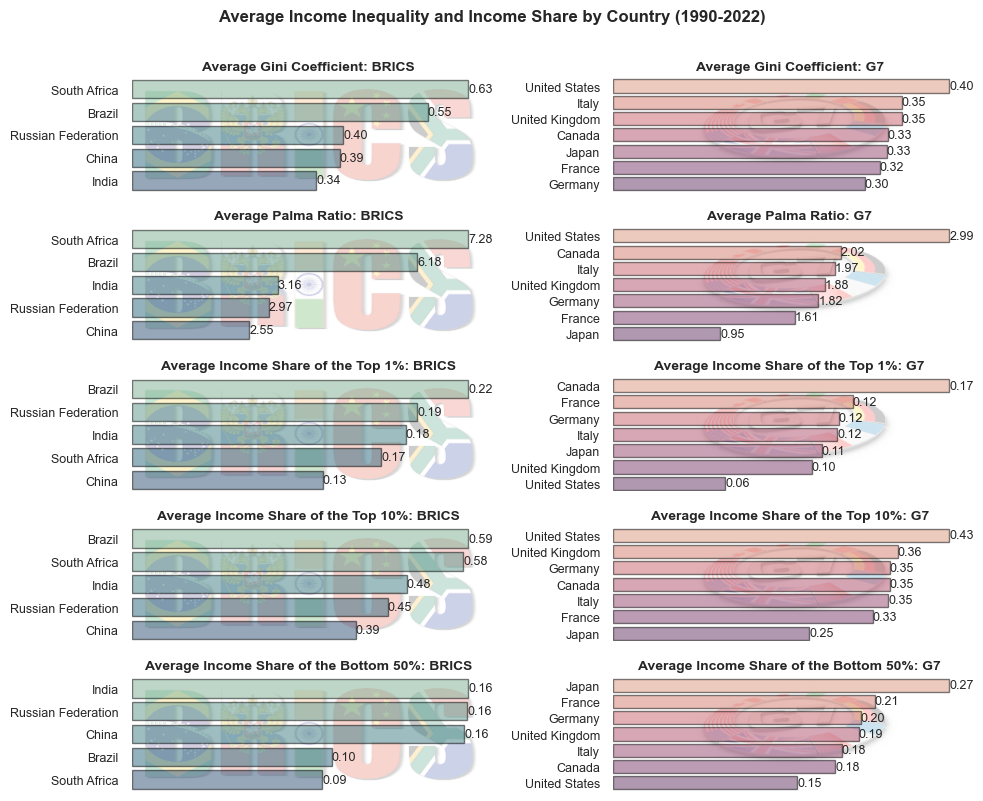

In [74]:
#avereages of income inequality and share of income

#creating subplots
fig,ax = plt.subplots(5,2)

#plotting BRICS Gini index bar chart
sns.barplot(data=BRICS_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False), 
            x='Gini coefficient', 
            y=BRICS_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[0,0])
#setting title
ax[0,0].set_title('Average Gini Coefficient: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[0,0].bar_label(ax[0,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[0,0].imshow(brics_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[0,0].xaxis.set_visible(False)
ax[0,0].set(ylabel=None)
ax[0,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[0,0].set_frame_on(False)

########################################################################################################################################################

#plotting G7 Gini index barchart
sns.barplot(data=G7_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False), 
            x='Gini coefficient', 
            y=G7_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[0,1])
#setting title
ax[0,1].set_title('Average Gini Coefficient: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[0,1].bar_label(ax[0,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
 #adjusting the axis labels and values
ax[0,1].set_ylabel('Country', 
                   fontsize=9)
ax[0,1].set_xlabel('Gini coefficient', 
                   fontsize=9)
ax[0,1].tick_params(axis='both', labelsize=9)
#displaying background image
ax[0,1].imshow(g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[0,1].xaxis.set_visible(False)
ax[0,1].set(ylabel=None)
ax[0,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[0,1].set_frame_on(False)

############################################################################################################################################

#plotting BRICS palma ratio bar chart
sns.barplot(data=BRICS_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False), 
            x='Palma ratio', 
            y=BRICS_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[1,0])
#setting title
ax[1,0].set_title('Average Palma Ratio: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[1,0].bar_label(ax[1,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[1,0].imshow(brics_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[1,0].xaxis.set_visible(False)
ax[1,0].set(ylabel=None)
ax[1,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[1,0].set_frame_on(False)

############################################################################################################################################

#plotting G7 palma ratio bar chart
sns.barplot(data=G7_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False), 
            x='Palma ratio', 
            y=G7_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[1,1])
#setting title
ax[1,1].set_title('Average Palma Ratio: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[1,1].bar_label(ax[1,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[1,1].imshow(g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[1,1].xaxis.set_visible(False)
ax[1,1].set(ylabel=None)
ax[1,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[1,1].set_frame_on(False)

#############################################################################################################################################

#plotting BRICS Top 1% share of income bar chart
sns.barplot(data=BRICS_share_of_income_gini_index_mean.sort_values(by='Top 1% share', ascending=False), 
            x='Top 1% share', 
            y=BRICS_share_of_income_gini_index_mean.sort_values(by='Top 1% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[2,0])
#setting title
ax[2,0].set_title('Average Income Share of the Top 1%: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[2,0].bar_label(ax[2,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[2,0].imshow(brics_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[2,0].xaxis.set_visible(False)
ax[2,0].set(ylabel=None)
ax[2,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[2,0].set_frame_on(False)

######################################################################################################################################################

#plotting G7 Top 1% share of income bar chart
sns.barplot(data=G7_share_of_income_gini_index_mean.sort_values(by='Top 1% share', ascending=False), 
            x='Top 1% share', 
            y=G7_share_of_income_gini_index_mean.index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[2,1])
#setting title
ax[2,1].set_title('Average Income Share of the Top 1%: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[2,1].bar_label(ax[2,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[2,1].imshow(g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[2,1].xaxis.set_visible(False)
ax[2,1].set(ylabel=None)
ax[2,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[2,1].set_frame_on(False)

######################################################################################################################################################

#plotting BRICS Top 10% share of income bar chart
sns.barplot(data=BRICS_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False), 
            x='Top 10% share', 
            y=BRICS_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[3,0])
#setting title
ax[3,0].set_title('Average Income Share of the Top 10%: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[3,0].bar_label(ax[3,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[3,0].imshow(brics_image, 
               extent=ax[3,0].get_xlim() + ax[3,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[3,0].xaxis.set_visible(False)
ax[3,0].set(ylabel=None)
ax[3,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[3,0].set_frame_on(False)

##############################################################################################################################

#plotting G7 Top 10% share of income bar chart
sns.barplot(data=G7_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False), 
            x='Top 10% share', 
            y=G7_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[3,1])
#setting title
ax[3,1].set_title('Average Income Share of the Top 10%: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[3,1].bar_label(ax[3,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[3,1].imshow(g7_image, 
               extent=ax[3,1].get_xlim() + ax[3,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[3,1].xaxis.set_visible(False)
ax[3,1].set(ylabel=None)
ax[3,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[3,1].set_frame_on(False)

###########################################################################################################################################

#plotting BRICS bottom 50% share of income bar chart
sns.barplot(data=BRICS_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False), 
            x='Bottom 50% share', 
            y=BRICS_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[4,0])
#setting title
ax[4,0].set_title('Average Income Share of the Bottom 50%: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[4,0].bar_label(ax[4,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[4,0].imshow(brics_image, 
               extent=ax[4,0].get_xlim() + ax[4,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[4,0].xaxis.set_visible(False)
ax[4,0].set(ylabel=None)
ax[4,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[4,0].set_frame_on(False)

###############################################################################################################################################

#plotting G7 Top 10% share of income bar chart
sns.barplot(data=G7_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False), 
            x='Bottom 50% share', 
            y=G7_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[4,1])
#setting title
ax[4,1].set_title('Average Income Share of the Bottom 50%: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[4,1].bar_label(ax[4,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[4,1].imshow(g7_image, 
               extent=ax[4,1].get_xlim() + ax[4,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[4,1].xaxis.set_visible(False)
ax[4,1].set(ylabel=None)
ax[4,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[4,1].set_frame_on(False)

plt.suptitle('Average Income Inequality and Income Share by Country (1990-2022)',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

**Key Takeaways**

1. **Income Inequality: Gini Coefficient and Palma Ratio**

- The Gini coefficient ranges from 0 (perfect equality) to 1 (perfect inequality). A coefficient of 0.50 or more indicates significant income disparity. Among the BRICS nations, South Africa and Brazil have the highest average Gini coefficients for the period, at 0.63 and 0.55 respectively, while the other BRICS countries have averages below 0.4. For the G7 nations, the average Gini coefficient for the period ranges between 0.3 and 0.4, with United States having the highest and Germany the lowest.

- The Palma ratio highlights the income inequality between the top 10% and the bottom 50%. South Africa and Brazil again show the highest inequality among the BRICS nations. Among the G7 nations, United States has the highest average Palma ratio at 2.99, while Japan has the lowest at 0.95.

2. **Share of Income**

**Top 1% Share of Income**

- For the BRICS nations:

    - Brazil has the highest income share at 0.22.

    - China ranks last with 0.13.

- For the G7 nations:

    - Canada leads with a share of 0.17.

    - The United States ranks last with 0.06.

**Top 10% Share of Income**

- For the BRICS nations:

    - Brazil and South Africa have similar shares, at 0.59 and 0.58, respectively.

    - China ranks last with 0.39.

- For the G7 nations:

    - The United States has the highest share at 0.43.

    - Japan ranks last with 0.25.

**Bottom 50% Share of Income**

- For the BRICS nations:

    - India, Russia, and China have similar shares at 0.16.

    - South Africa has the lowest share in the group at 0.09.

- For the G7 nations:

    - Japan has the highest share at 0.27.

    - The United States has the lowest share in the group at 0.15.

### 5.2.2. Average Income Inequality and Income Share by Country Group (1990-2022)

In [75]:
BRICS_G7_share_of_income_gini_index_mean = df_inequality_final.groupby('Country Group')[['Gini coefficient',
                                                                                         'Palma ratio', 
                                                                                         'Bottom 50% share', 
                                                                                         'Top 10% share',
                                                                                         'Top 1% share']].mean()
BRICS_G7_share_of_income_gini_index_mean

,Gini coefficient,Palma ratio,Bottom 50% share,Top 10% share,Top 1% share
Country Group,,,,,
BRICS,0.461668,4.426762,0.133615,0.498223,0.178496
G7,0.339989,1.890993,0.194683,0.347866,0.113281


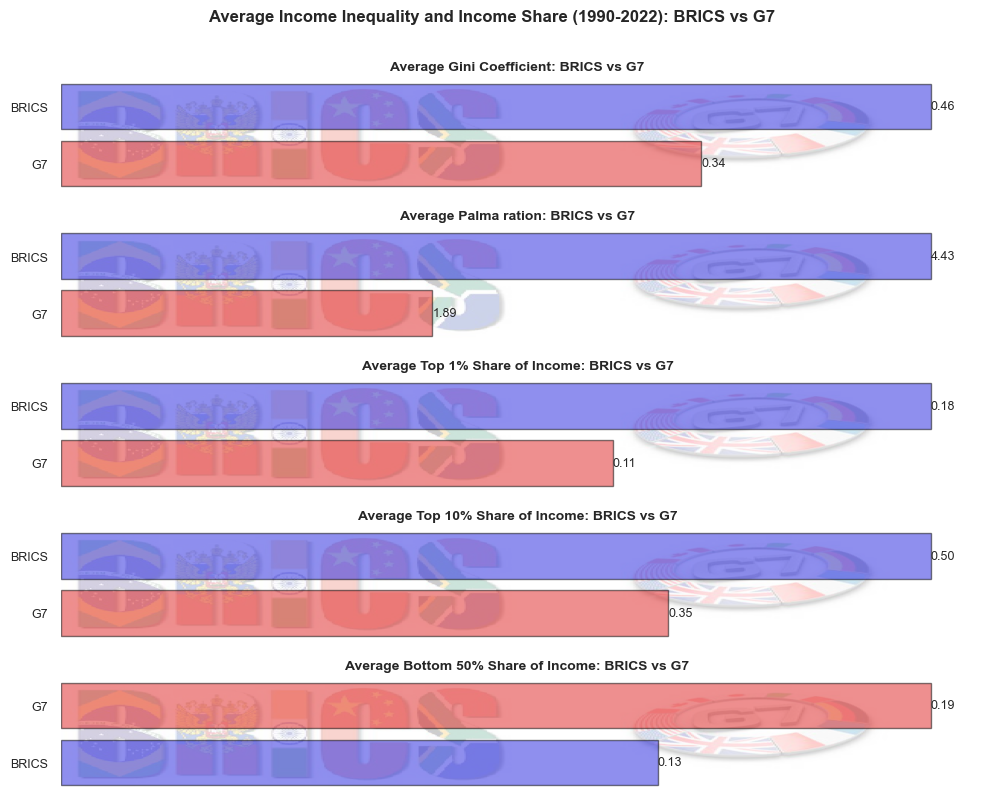

In [76]:
#plotting barcharts to show the average income inequality and share of income

#creating subplots
fig, ax = plt.subplots(5)

#plotting BRICS vs G7 average gini coefficient bar chart
sns.barplot(data=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False), 
            x='Gini coefficient', 
            y=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Gini coefficient', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['blue', 'red'],
            ax=ax[0])
#setting title
ax[0].set_title('Average Gini Coefficient: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[0].bar_label(ax[0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')

#displaying background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[0].xaxis.set_visible(False)
ax[0].set(ylabel=None)
ax[0].tick_params(axis='both', labelsize=9)
#removing frame
ax[0].set_frame_on(False)

##########################################################################################################################

#plotting BRICS vs G7 average palma ratio bar chart
sns.barplot(data=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False), 
            x='Palma ratio', 
            y=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Palma ratio', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['blue', 'red'],
            ax=ax[1])
#setting title
ax[1].set_title('Average Palma ration: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[1].bar_label(ax[1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[1].xaxis.set_visible(False)
ax[1].set(ylabel=None)
ax[1].tick_params(axis='both', labelsize=9)
#removing frame
ax[1].set_frame_on(False)

################################################################################################################################

#plotting BRICS vs G7 average top 1% share bar chart
sns.barplot(data=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Top 1% share', ascending=False), 
            x='Top 1% share', 
            y=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Top 1% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['blue', 'red'],
            ax=ax[2])
#setting title
ax[2].set_title('Average Top 1% Share of Income: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[2].bar_label(ax[2].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[2].imshow(brics_g7_image, 
             extent=ax[2].get_xlim() + ax[2].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[2].xaxis.set_visible(False)
ax[2].set(ylabel=None)
ax[2].tick_params(axis='both', labelsize=9)
#removing frame
ax[2].set_frame_on(False)

#############################################################################################################################

#plotting BRICS vs G7 average top 10% share bar chart
sns.barplot(data=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False), 
            x='Top 10% share', 
            y=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Top 10% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['blue', 'red'],
            ax=ax[3])
#setting title
ax[3].set_title('Average Top 10% Share of Income: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[3].bar_label(ax[3].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[3].imshow(brics_g7_image, 
             extent=ax[3].get_xlim() + ax[3].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[3].xaxis.set_visible(False)
ax[3].set(ylabel=None)
ax[3].tick_params(axis='both', labelsize=9)
#removing frame
ax[3].set_frame_on(False)

######################################################################################################################

#plotting BRICS vs G7 average bottom 50% share of income bar chart
sns.barplot(data=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False), 
            x='Bottom 50% share', 
            y=BRICS_G7_share_of_income_gini_index_mean.sort_values(by='Bottom 50% share', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[4])
#setting title
ax[4].set_title('Average Bottom 50% Share of Income: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[4].bar_label(ax[4].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[4].imshow(brics_g7_image, 
             extent=ax[4].get_xlim() + ax[4].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[4].xaxis.set_visible(False)
ax[4].set(ylabel=None)
ax[4].tick_params(axis='both', labelsize=9)
#removing frame
ax[4].set_frame_on(False)

#setting main title
plt.suptitle('Average Income Inequality and Income Share (1990-2022): BRICS vs G7',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

**Key Takeaways**

1. **Income Inequality: Gini Coefficient and Palma Ratio**

- Averaging the Gini coefficient and Palma ratio over the period reveals that the BRICS countries exhibit higher income inequality compared to the G7 countries.

2. **Share of Income**

-  In each income share group, BRICS countries generally exhibit higher income shares compared to G7 countries. However, the exception lies in the bottom 50% income share, where, on average, G7 countries rank higher.

### 5.2.3. Average HDI Variables by Country

In [77]:
#creating new dataframes for BRICS and G7 that averages the columns we want for the period of 1990 to 2022
BRICS_hdi_mean = BRICS.groupby('Country')[['Human Development Index (value)',
                                           'Gross National Income Per Capita (2017 PPP$)', 
                                           'Life Expectancy at Birth (years)', 
                                           'Expected Years of Schooling (years)',
                                           'Mean Years of Schooling (years)']].mean()

G7_hdi_mean = G7.groupby('Country')[['Human Development Index (value)',
                                      'Gross National Income Per Capita (2017 PPP$)', 
                                      'Life Expectancy at Birth (years)', 
                                      'Expected Years of Schooling (years)',
                                      'Mean Years of Schooling (years)']].mean()
print('Mean for each country in BRICS and G7')
print(BRICS_hdi_mean.to_string())
print('------------------------------------------------------------------------------------------------')
print(G7_hdi_mean.to_string())

Mean for each country in BRICS and G7
                    Human Development Index (value)  Gross National Income Per Capita (2017 PPP$)  Life Expectancy at Birth (years)  Expected Years of Schooling (years)  Mean Years of Schooling (years)
Country                                                                                                                                                                                                  
Brazil                                     0.699667                                  12663.603667                         71.335697                            14.032970                         6.182545
China                                      0.647455                                   7605.402848                         73.886576                            11.734030                         6.365818
India                                      0.541485                                   3771.922879                         65.080970                       

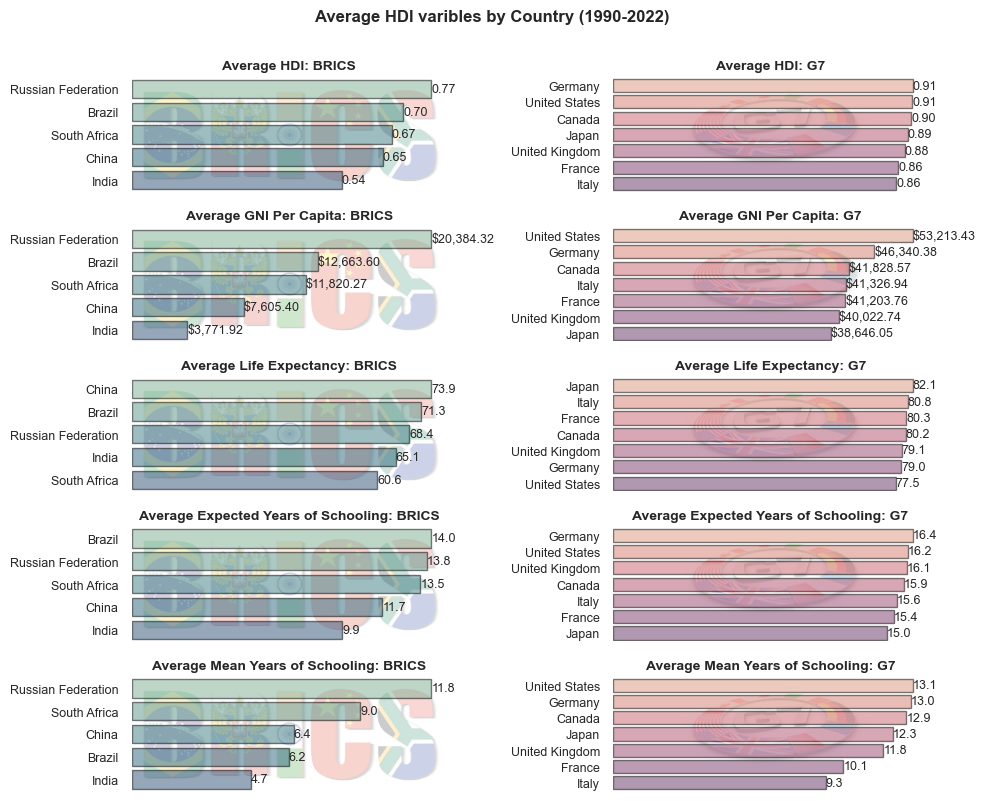

In [78]:
#avereages of income inequality and share of income

#creating subplots
fig,ax = plt.subplots(5,2)

#plotting BRICS hdi bar chart
sns.barplot(data=BRICS_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False), 
            x='Human Development Index (value)', 
            y=BRICS_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[0,0])
#setting title
ax[0,0].set_title('Average HDI: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[0,0].bar_label(ax[0,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
#displaying background image
ax[0,0].imshow(brics_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[0,0].xaxis.set_visible(False)
ax[0,0].set(ylabel=None)
ax[0,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[0,0].set_frame_on(False)

########################################################################################################################################################

#plotting G7 hdi barchart
sns.barplot(data=G7_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False), 
            x='Human Development Index (value)', 
            y=G7_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[0,1])
#setting title
ax[0,1].set_title('Average HDI: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[0,1].bar_label(ax[0,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')
 #adjusting the axis labels and values
ax[0,1].set_ylabel('Country', 
                   fontsize=9)
ax[0,1].set_xlabel('HDI', 
                   fontsize=9)
ax[0,1].tick_params(axis='both', labelsize=9)
#displaying background image
ax[0,1].imshow(g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[0,1].xaxis.set_visible(False)
ax[0,1].set(ylabel=None)
ax[0,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[0,1].set_frame_on(False)

############################################################################################################################################

#plotting BRICS GNI per capita bar chart
sns.barplot(data=BRICS_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False), 
            x='Gross National Income Per Capita (2017 PPP$)', 
            y=BRICS_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[1,0])
#setting title
ax[1,0].set_title('Average GNI Per Capita: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[1,0].bar_label(ax[1,0].containers[i], label_type="edge",fontsize=9,fmt='${:,.2f}')
#displaying background image
ax[1,0].imshow(brics_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[1,0].xaxis.set_visible(False)
ax[1,0].set(ylabel=None)
ax[1,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[1,0].set_frame_on(False)

############################################################################################################################################

#plotting G7 GNI per capita bar chart
sns.barplot(data=G7_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False), 
            x='Gross National Income Per Capita (2017 PPP$)', 
            y=G7_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[1,1])
#setting title
ax[1,1].set_title('Average GNI Per Capita: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[1,1].bar_label(ax[1,1].containers[i], label_type="edge",fontsize=9,fmt='${:,.2f}')
#displaying background image
ax[1,1].imshow(g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[1,1].xaxis.set_visible(False)
ax[1,1].set(ylabel=None)
ax[1,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[1,1].set_frame_on(False)

#############################################################################################################################################

#plotting BRICS life expectancy bar chart
sns.barplot(data=BRICS_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False), 
            x='Life Expectancy at Birth (years)', 
            y=BRICS_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[2,0])
#setting title
ax[2,0].set_title('Average Life Expectancy: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[2,0].bar_label(ax[2,0].containers[i], label_type="edge",fontsize=9, fmt='{:,.1f}')
#displaying background image
ax[2,0].imshow(brics_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[2,0].xaxis.set_visible(False)
ax[2,0].set(ylabel=None)
ax[2,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[2,0].set_frame_on(False)

######################################################################################################################################################

#plotting G7 life expectancy bar chart
sns.barplot(data=G7_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False), 
            x='Life Expectancy at Birth (years)', 
            y=G7_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[2,1])
#setting title
ax[2,1].set_title('Average Life Expectancy: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[2,1].bar_label(ax[2,1].containers[i], label_type="edge",fontsize=9, fmt='{:,.1f}')
#displaying background image
ax[2,1].imshow(g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[2,1].xaxis.set_visible(False)
ax[2,1].set(ylabel=None)
ax[2,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[2,1].set_frame_on(False)

######################################################################################################################################################

#plotting BRICS expected years of schooling bar chart
sns.barplot(data=BRICS_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False), 
            x='Expected Years of Schooling (years)', 
            y=BRICS_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[3,0])
#setting title
ax[3,0].set_title('Average Expected Years of Schooling: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[3,0].bar_label(ax[3,0].containers[i], label_type="edge",fontsize=9, fmt='{:,.1f}')
#displaying background image
ax[3,0].imshow(brics_image, 
               extent=ax[3,0].get_xlim() + ax[3,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[3,0].xaxis.set_visible(False)
ax[3,0].set(ylabel=None)
ax[3,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[3,0].set_frame_on(False)

##############################################################################################################################

#plotting G7 expected years of schooling bar chart
sns.barplot(data=G7_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False), 
            x='Expected Years of Schooling (years)', 
            y=G7_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[3,1])
#setting title
ax[3,1].set_title('Average Expected Years of Schooling: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[3,1].bar_label(ax[3,1].containers[i], label_type="edge",fontsize=9,fmt='{:,.1f}')
#displaying background image
ax[3,1].imshow(g7_image, 
               extent=ax[3,1].get_xlim() + ax[3,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[3,1].xaxis.set_visible(False)
ax[3,1].set(ylabel=None)
ax[3,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[3,1].set_frame_on(False)

###########################################################################################################################################

#plotting BRICS mean years of schooling bar chart
sns.barplot(data=BRICS_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False), 
            x='Mean Years of Schooling (years)', 
            y=BRICS_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='crest',
            ax=ax[4,0])
#setting title
ax[4,0].set_title('Average Mean Years of Schooling: BRICS',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,5)):
    ax[4,0].bar_label(ax[4,0].containers[i], label_type="edge",fontsize=9,fmt='{:,.1f}')
#displaying background image
ax[4,0].imshow(brics_image, 
               extent=ax[4,0].get_xlim() + ax[4,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[4,0].xaxis.set_visible(False)
ax[4,0].set(ylabel=None)
ax[4,0].tick_params(axis='both', labelsize=9)
#removing frame
ax[4,0].set_frame_on(False)

###############################################################################################################################################

#plotting G7 mean years of schooling bar chart
sns.barplot(data=G7_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False), 
            x='Mean Years of Schooling (years)', 
            y=G7_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black',
            palette='flare',
            ax=ax[4,1])
#setting title
ax[4,1].set_title('Average Mean Years of Schooling: G7',
                  fontweight='bold',
                  fontsize=10,
                  wrap=True)
#plotting data labels
for i in list(range(0,7)):
    ax[4,1].bar_label(ax[4,1].containers[i], label_type="edge",fontsize=9, fmt='{:,.1f}')
#displaying background image
ax[4,1].imshow(g7_image, 
               extent=ax[4,1].get_xlim() + ax[4,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)
#adjusting the axis labels and values
ax[4,1].xaxis.set_visible(False)
ax[4,1].set(ylabel=None)
ax[4,1].tick_params(axis='both', labelsize=9)
#removing frame
ax[4,1].set_frame_on(False)

plt.suptitle('Average HDI varibles by Country (1990-2022)',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

**Key Takeaways**

1. **HDI**

- According to the United Nations Development Programme (UNDP), HDI is ranked as follows:

    - Below 0.550: Low human development

    - 0.550 to 0.699: Medium human development

    - 0.700 to 0.799: High human development

    - 0.800 and above: Very high human development (Source: UNDP link)

- Among BRICS nations:

    - Russia falls into the high human development category.

    - Brazil, South Africa, and China are in the medium human development category.

    - India is in the low human development category on average for the period.

- All G7 countries have very high human development on average, with Germany ranking first.

2. **GNI Per Capita**

- According to the World Bank, GNI per capita classifications are as follows:

    - \\$1,135 or less: Low-income countries.

    - \\$1,136 to \\$4,465: Lower-middle-income countries.

    - \\$4,466 to \\$13,845: Upper-middle-income countries.

    - More than \\$13,846: High-income countries ['https://www.worldbank.org/en/country/mic/overview']

- For BRICS nations:

    - Russia is considered a high-income nation with an average GNI per capita of \\$20,384.

    - Brazil, South Africa, and China are upper-middle-income countries.

    - India falls into the lower-middle-income bracket.

- All G7 nations are high-income countries, with the United States having the highest average GNI per capita of \\$53,213.

3. **Life Expectancy**

- For BRICS nations:

    - The average life expectancy ranges between 60.5 years (South Africa) and 73.9 years (China).

- For G7 nations:

    - Life expectancy ranges between 77.5 years (United States) and 82.1 years (Japan).

4. **Expected Years of Schooling**

- For BRICS nations:

    - India has the lowest average expected years of schooling (9.9 years).

    - Brazil has the highest (14 years).

- For G7 nations:

    - The average expected years of schooling range from 15 years (Japan) to 16.4 years (Germany), with minimal differences among the countries.

5. **Mean Years of Schooling**

- For BRICS nations:

    - Russia tops with an average of 11.8 years.

    - India is last with 4.7 years.

- For G7 nations:

    - Italy has the lowest average (9.3 years).

    - The United States has the highest average (13.1 years).

### 5.2.4. Average HDI Variables by Country Group

In [79]:
BRICS_G7_hdi_mean = df_inequality_final.groupby('Country Group')[['Human Development Index (value)',
                                                                  'Gross National Income Per Capita (2017 PPP$)', 
                                                                  'Life Expectancy at Birth (years)', 
                                                                  'Expected Years of Schooling (years)',
                                                                  'Mean Years of Schooling (years)']].mean()
BRICS_G7_hdi_mean

,Human Development Index (value),Gross National Income Per Capita (2017 PPP$),Life Expectancy at Birth (years),Expected Years of Schooling (years),Mean Years of Schooling (years)
Country Group,,,,,
BRICS,0.666370,11249.104042,67.855182,12.587673,7.605903
G7,0.887485,43225.980766,79.853610,15.788113,11.795368


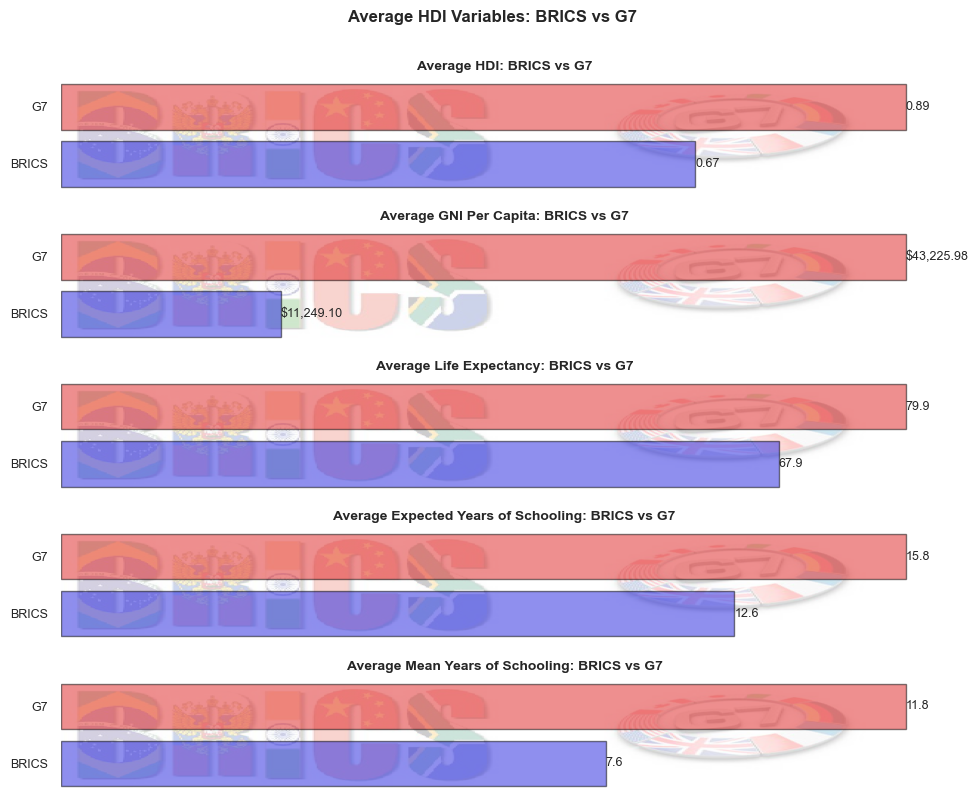

In [80]:
#plotting barcharts to show the average HDI variables

#creating subplots
fig, ax = plt.subplots(5)

#plotting BRICS vs G7 average HDI bar chart
sns.barplot(data=BRICS_G7_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False), 
            x='Human Development Index (value)', 
            y=BRICS_G7_hdi_mean.sort_values(by='Human Development Index (value)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[0])
#setting title
ax[0].set_title('Average HDI: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[0].bar_label(ax[0].containers[i], label_type="edge",fontsize=9,fmt='{:,.2f}')

#displaying background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[0].xaxis.set_visible(False)
ax[0].set(ylabel=None)
ax[0].tick_params(axis='both', labelsize=9)
#removing frame
ax[0].set_frame_on(False)

##########################################################################################################################

#plotting BRICS vs G7 average GNI per capita bar chart
sns.barplot(data=BRICS_G7_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False), 
            x='Gross National Income Per Capita (2017 PPP$)', 
            y=BRICS_G7_hdi_mean.sort_values(by='Gross National Income Per Capita (2017 PPP$)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[1])
#setting title
ax[1].set_title('Average GNI Per Capita: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[1].bar_label(ax[1].containers[i], label_type="edge",fontsize=9,fmt='${:,.2f}')
#displaying background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[1].xaxis.set_visible(False)
ax[1].set(ylabel=None)
ax[1].tick_params(axis='both', labelsize=9)
#removing frame
ax[1].set_frame_on(False)

################################################################################################################################

#plotting BRICS vs G7 average life expectancy bar chart
sns.barplot(data=BRICS_G7_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False), 
            x='Life Expectancy at Birth (years)', 
            y=BRICS_G7_hdi_mean.sort_values(by='Life Expectancy at Birth (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[2])
#setting title
ax[2].set_title('Average Life Expectancy: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[2].bar_label(ax[2].containers[i], label_type="edge",fontsize=9,fmt='{:,.1f}')
#displaying background image
ax[2].imshow(brics_g7_image, 
             extent=ax[2].get_xlim() + ax[2].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[2].xaxis.set_visible(False)
ax[2].set(ylabel=None)
ax[2].tick_params(axis='both', labelsize=9)
#removing frame
ax[2].set_frame_on(False)

#############################################################################################################################

#plotting BRICS vs G7 average expected years of schooling bar chart
sns.barplot(data=BRICS_G7_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False), 
            x='Expected Years of Schooling (years)', 
            y=BRICS_G7_hdi_mean.sort_values(by='Expected Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[3])
#setting title
ax[3].set_title('Average Expected Years of Schooling: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[3].bar_label(ax[3].containers[i], label_type="edge",fontsize=9,fmt='{:,.1f}')
#displaying background image
ax[3].imshow(brics_g7_image, 
             extent=ax[3].get_xlim() + ax[3].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[3].xaxis.set_visible(False)
ax[3].set(ylabel=None)
ax[3].tick_params(axis='both', labelsize=9)
#removing frame
ax[3].set_frame_on(False)

######################################################################################################################

#plotting BRICS vs G7 average mean years of schooling bar chart
sns.barplot(data=BRICS_G7_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False), 
            x='Mean Years of Schooling (years)', 
            y=BRICS_G7_hdi_mean.sort_values(by='Mean Years of Schooling (years)', ascending=False).index, 
            alpha=0.5, 
            edgecolor='black', 
            palette=['red', 'blue'],
            ax=ax[4])
#setting title
ax[4].set_title('Average Mean Years of Schooling: BRICS vs G7',
                fontweight='bold',
                fontsize=10,
                wrap=True)
#plotting data labels
for i in list(range(0,2)):
    ax[4].bar_label(ax[4].containers[i], label_type="edge",fontsize=9,fmt='{:,.1f}')
#displaying background image
ax[4].imshow(brics_g7_image, 
             extent=ax[4].get_xlim() + ax[4].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)
#adjusting the axis labels and values
ax[4].xaxis.set_visible(False)
ax[4].set(ylabel=None)
ax[4].tick_params(axis='both', labelsize=9)
#removing frame
ax[4].set_frame_on(False)

#setting main title
plt.suptitle('Average HDI Variables: BRICS vs G7',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

**Key Takeaways**

On average, the G7 nations outperform the BRICS nations across all Human Development Index (HDI) variables. The G7 countries exhibit very high human development, significantly higher Gross National Income (GNI) per capita, longer life expectancy, and more years of both expected and mean years of schooling.

## 5.3. Distributions

### 5.3.1. Distributions of Income Inequality and Share of Income

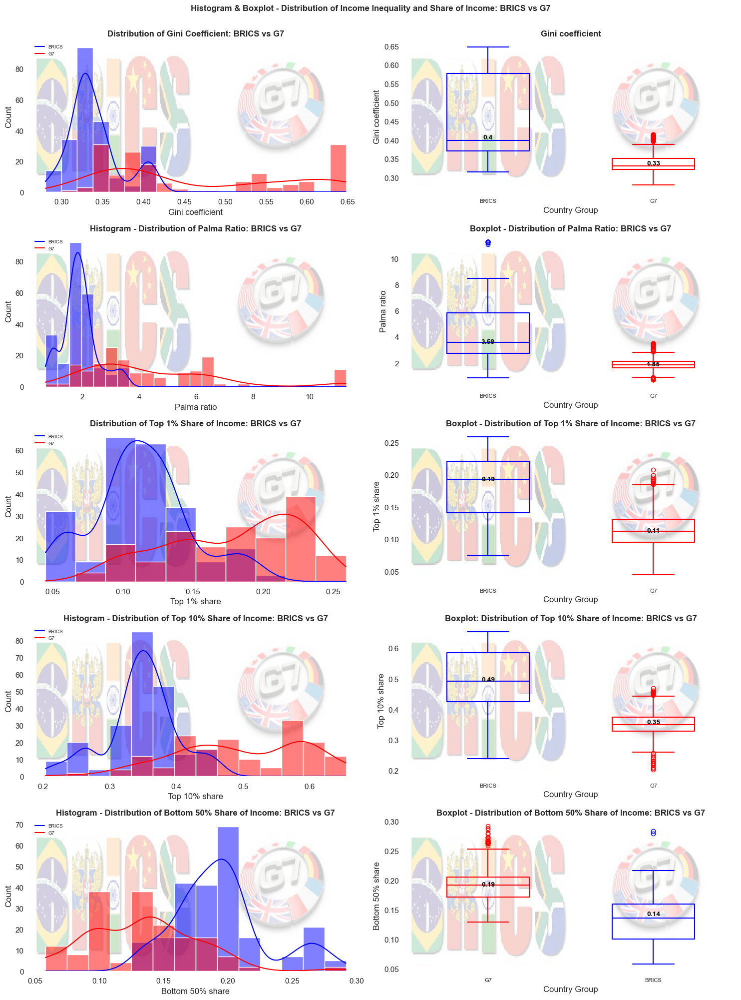

In [81]:
#plotting histograms and boxplot to analyze distribution

#creating subplots
fig, ax = plt.subplots(nrows=5,ncols=2, figsize=(15,20))

#plotting gini coefficient histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Gini coefficient',  
             hue='Country Group',
             palette=['red','blue'],
             kde=True,
             ax=ax[0,0])
#setting title
ax[0,0].set_title('Distribution of Gini Coefficient: BRICS vs G7', 
                  fontweight='bold')
#adjusting tick labels and removing chart frame
ax[0,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[0,0].set_frame_on(False)
#displaying background image
ax[0,0].imshow(brics_g7_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

############################################################################################################################

#calculating Gini coefficient median
medians_1 = df_inequality_final.groupby(['Country Group'])['Gini coefficient'].median().round(2).sort_values(ascending=False)
vertical_offset_1 = df_inequality_final['Gini coefficient'].median() * 0.02 # offset from median for display

#plotting boxplot gini coefficient BRICS vs G7
boxplot_1 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Gini coefficient', 
                        order=medians_1.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[0,1])
#plotting median data labels
for xtick in boxplot_1.get_xticks():
    boxplot_1.text(xtick,medians_1[xtick] + vertical_offset_1,medians_1[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[0,1].set_title('Gini coefficient', 
                  fontweight='bold')  
#adjusting tick lable and removing chart frame
ax[0,1].set_xticklabels(list(medians_1.index),
                        fontsize=8)
ax[0,1].set_frame_on(False)
#displaying backgroud image
ax[0,1].imshow(brics_g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#############################################################################################################################################

#plotting palma ratio histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Palma ratio', 
             hue='Country Group',
             palette=['red','blue'],
             kde=True,
             ax=ax[1,0])
#setting title
ax[1,0].set_title('Histogram - Distribution of Palma Ratio: BRICS vs G7', 
                  fontweight='bold')
##setting legend and removing chart frame
ax[1,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[1,0].set_frame_on(False)
#displaying background image
ax[1,0].imshow(brics_g7_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#################################################################################################################################

#calculating palma ratio median
medians_2 = df_inequality_final.groupby(['Country Group'])['Palma ratio'].median().round(2).sort_values(ascending=False)
vertical_offset_2 = df_inequality_final['Palma ratio'].median() * 0.02 # offset from median for display

#plotting boxplot palma ratio BRICS vs G7
boxplot_2 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Palma ratio', 
                        order=medians_2.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[1,1])
#plotting median data labels
for xtick in boxplot_2.get_xticks():
    boxplot_2.text(xtick,medians_2[xtick] + vertical_offset_2,medians_2[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[1,1].set_title('Boxplot - Distribution of Palma Ratio: BRICS vs G7', 
                  fontweight='bold') 
#adjusting tick labels and removing chart frame
ax[1,1].set_xticklabels(list(medians_2.index),
                        fontsize=8)
ax[1,1].set_frame_on(False)
#displaying background image
ax[1,1].imshow(brics_g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##############################################################################################################################

#plotting top 1% share of income histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Top 1% share',  
             hue='Country Group',
             palette=['red','blue'],
             kde=True,
             ax=ax[2,0])
#setting title
ax[2,0].set_title('Distribution of Top 1% Share of Income: BRICS vs G7', 
                  fontweight='bold')
#adjusting legend and removing chart frame
ax[2,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[2,0].set_frame_on(False)
#displaying background image
ax[2,0].imshow(brics_g7_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#######################################################################################################################################

#calculating top 1% share of income median
medians_3 = df_inequality_final.groupby(['Country Group'])['Top 1% share'].median().round(2).sort_values(ascending=False)
vertical_offset_3 = df_inequality_final['Top 1% share'].median() * 0.02 # offset from median for display

#plotting boxplot top 1% share of income BRICS vs G7
boxplot_3 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Top 1% share', 
                        order=medians_3.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[2,1])
#plotting median data labels
for xtick in boxplot_3.get_xticks():
    boxplot_3.text(xtick,medians_3[xtick] + vertical_offset_3,medians_3[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[2,1].set_title('Boxplot - Distribution of Top 1% Share of Income: BRICS vs G7', 
                  fontweight='bold')  
#adjusting tick labels and removing chart frame
ax[2,1].set_xticklabels(list(medians_3.index),
                        fontsize=8)
ax[2,1].set_frame_on(False)
#displaying background image
ax[2,1].imshow(brics_g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.23)

###############################################################################################################################
               
#plotting top 10% share of income histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Top 10% share',  
             hue='Country Group',
             palette=['red','blue'],
             kde=True,
             ax=ax[3,0])
#setting title
ax[3,0].set_title('Histogram - Distribution of Top 10% Share of Income: BRICS vs G7', 
                  fontweight='bold')
#adjusting legend and removing chart frame
ax[3,0].legend(list(df_inequality_final['Country Group'].unique()), 
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[3,0].set_frame_on(False)
#displaying background image
ax[3,0].imshow(brics_g7_image, 
               extent=ax[3,0].get_xlim() + ax[3,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##########################################################################################################################################

#calculating top 10% share median
medians_4 = df_inequality_final.groupby(['Country Group'])['Top 10% share'].median().round(2).sort_values(ascending=False)
vertical_offset_4 = df_inequality_final['Top 10% share'].median() * 0.02 # offset from median for display

#plotting boxplot top 10% share BRICS vs G7
boxplot_4 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Top 10% share', 
                        order=medians_4.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[3,1])
#plotting median data labels
for xtick in boxplot_4.get_xticks():
    boxplot_4.text(xtick,medians_4[xtick] + vertical_offset_4,medians_4[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[3,1].set_title('Boxplot: Distribution of Top 10% Share of Income: BRICS vs G7', 
                  fontweight='bold')   
#adjusting tick labels and removing chart frame
ax[3,1].set_xticklabels(list(medians_4.index),
                        fontsize=8)
ax[3,1].set_frame_on(False)
#displaying background image
ax[3,1].imshow(brics_g7_image, 
               extent=ax[3,1].get_xlim() + ax[3,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##########################################################################################################################################

#plotting bottom 50% share of income histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Bottom 50% share',  
             hue='Country Group',
             palette=['red','blue'], 
             kde=True,
             ax=ax[4,0])
#setting title
ax[4,0].set_title('Histogram - Distribution of Bottom 50% Share of Income: BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[4,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[4,0].set_frame_on(False)
#displaying background image
ax[4,0].imshow(brics_g7_image, 
               extent=ax[4,0].get_xlim() + ax[4,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha=0.2)

#############################################################################################################################################

#calculating bottom 50% share of income median
medians_5 = df_inequality_final.groupby(['Country Group'])['Bottom 50% share'].median().round(2).sort_values(ascending=False)
vertical_offset_5 = df_inequality_final['Bottom 50% share'].median() * 0.02 # offset from median for display

#plotting boxplot gini coefficient BRICS vs G7
boxplot_5 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Bottom 50% share', 
                        order=medians_5.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[4,1])
#plotting median data labels
for xtick in boxplot_5.get_xticks():
    boxplot_5.text(xtick,medians_5[xtick] + vertical_offset_5,medians_5[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[4,1].set_title('Boxplot - Distribution of Bottom 50% Share of Income: BRICS vs G7', 
                  fontweight='bold')    
#adjusting tick labels and removing chart frame
ax[4,1].set_xticklabels(list(medians_5.index),
                        fontsize=8)
ax[4,1].set_frame_on(False)
#displaying background image
ax[4,1].imshow(brics_g7_image, 
               extent=ax[4,1].get_xlim() + ax[4,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#setting main title
plt.suptitle('Histogram & Boxplot - Distribution of Income Inequality and Share of Income: BRICS vs G7',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

### 5.3.2. Distributions of HDI data

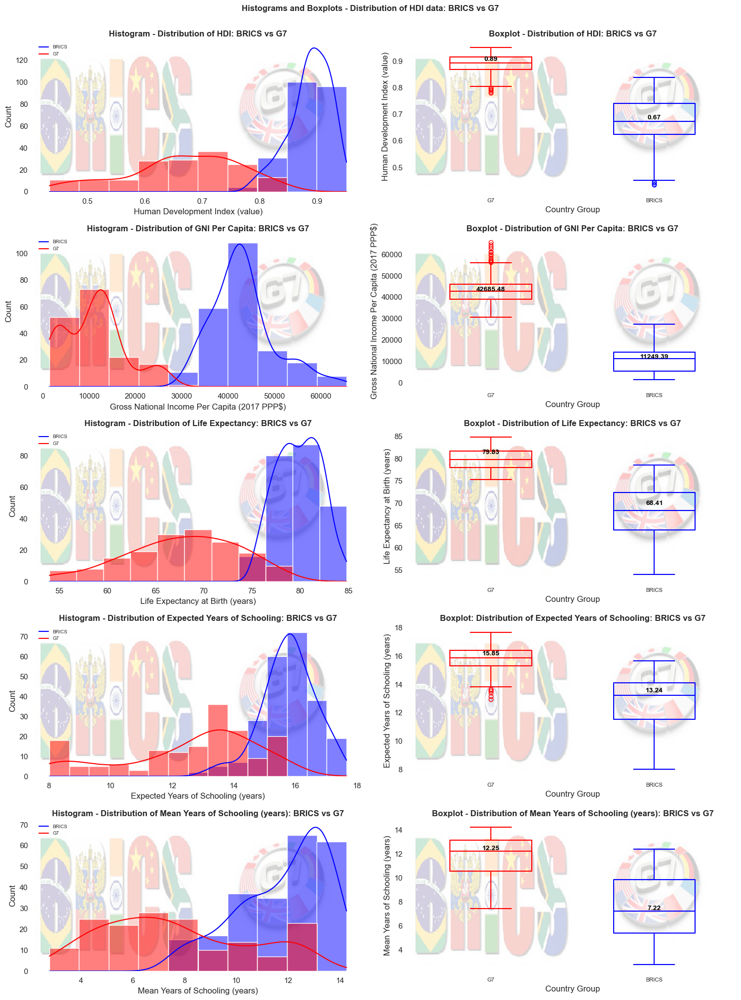

In [82]:
#plotting distributions of HDI varibales using histograms and boxplots

#creating subplots
fig, ax = plt.subplots(nrows=5, ncols=2,figsize=(15,20))

#plotting HDI histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Human Development Index (value)',  
             ax=ax[0,0], 
             hue='Country Group',
             palette=['red','blue'],
             kde=True)
#setting title
ax[0,0].set_title('Histogram - Distribution of HDI: BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[0,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[0,0].set_frame_on(False)
#displaying background image
ax[0,0].imshow(brics_g7_image, 
               extent=ax[0,0].get_xlim() + ax[0,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

############################################################################################################################

#calculating HDI median
medians_1 = df_inequality_final.groupby(['Country Group'])['Human Development Index (value)'].median().round(2).sort_values(ascending=False)
vertical_offset_1 = df_inequality_final['Human Development Index (value)'].median() * 0.02 # offset from median for display

#plotting boxplot HDI BRICS vs G7
boxplot_1 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Human Development Index (value)', 
                        order=medians_1.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[0,1])
#plotting median data labels
for xtick in boxplot_1.get_xticks():
    boxplot_1.text(xtick,medians_1[xtick] + vertical_offset_1,medians_1[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[0,1].set_title('Boxplot - Distribution of HDI: BRICS vs G7', 
                  fontweight='bold')  
#adjusting tick lable and removing chart frame
ax[0,1].set_xticklabels(list(medians_1.index),
                        fontsize=8)
ax[0,1].set_frame_on(False)
#displaying backgroud image
ax[0,1].imshow(brics_g7_image, 
               extent=ax[0,1].get_xlim() + ax[0,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

###########################################################################################################################

#plotting GNI per capita histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Gross National Income Per Capita (2017 PPP$)',  
             ax=ax[1,0],
             hue='Country Group',
             palette=['red','blue'],
             kde=True)
#setting title
ax[1,0].set_title('Histogram - Distribution of GNI Per Capita: BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[1,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[1,0].set_frame_on(False)
#displaying background image
ax[1,0].imshow(brics_g7_image, 
               extent=ax[1,0].get_xlim() + ax[1,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#################################################################################################################################

#calculating GNI per capita median
medians_2 = df_inequality_final.groupby(['Country Group'])['Gross National Income Per Capita (2017 PPP$)'].median().round(2).sort_values(ascending=False)
vertical_offset_2 = df_inequality_final['Gross National Income Per Capita (2017 PPP$)'].median() * 0.02 # offset from median for display

#plotting boxplot GNI per capita BRICS vs G7
boxplot_2 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Gross National Income Per Capita (2017 PPP$)', 
                        order=medians_2.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[1,1])
#plotting median data labels
for xtick in boxplot_2.get_xticks():
    boxplot_2.text(xtick,medians_2[xtick] + vertical_offset_2,medians_2[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[1,1].set_title('Boxplot - Distribution of GNI Per Capita: BRICS vs G7', 
                  fontweight='bold') 
#adjusting tick labels and removing chart frame
ax[1,1].set_xticklabels(list(medians_2.index),
                        fontsize=8)
ax[1,1].set_frame_on(False)
#displaying background image
ax[1,1].imshow(brics_g7_image, 
               extent=ax[1,1].get_xlim() + ax[1,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##################################################################################################################################

#plotting life expectancy histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Life Expectancy at Birth (years)',  
             ax=ax[2,0],
             hue='Country Group',
             palette=['red','blue'],
             kde=True)
#setting title
ax[2,0].set_title('Histogram - Distribution of Life Expectancy: BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[2,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[2,0].set_frame_on(False)
#displaying background image
ax[2,0].imshow(brics_g7_image, 
               extent=ax[2,0].get_xlim() + ax[2,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#######################################################################################################################################

#calculating life expectancy median
medians_3 = df_inequality_final.groupby(['Country Group'])['Life Expectancy at Birth (years)'].median().round(2).sort_values(ascending=False)
vertical_offset_3 = df_inequality_final['Life Expectancy at Birth (years)'].median() * 0.02 # offset from median for display

#plotting boxplot life expectancy BRICS vs G7
boxplot_3 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Life Expectancy at Birth (years)', 
                        order=medians_3.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[2,1])
#plotting median data labels
for xtick in boxplot_3.get_xticks():
    boxplot_3.text(xtick,medians_3[xtick] + vertical_offset_3,medians_3[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[2,1].set_title('Boxplot - Distribution of Life Expectancy: BRICS vs G7', 
                  fontweight='bold')  
#adjusting tick labels and removing chart frame
ax[2,1].set_xticklabels(list(medians_3.index),
                        fontsize=8)
ax[2,1].set_frame_on(False)
#displaying background image
ax[2,1].imshow(brics_g7_image, 
               extent=ax[2,1].get_xlim() + ax[2,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.23)

######################################################################################################################################

#plotting expected years of schooling histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Expected Years of Schooling (years)',  
             ax=ax[3,0],
             hue='Country Group',
             palette=['red','blue'],
             kde=True)
#setting title
ax[3,0].set_title('Histogram - Distribution of Expected Years of Schooling: BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[3,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[3,0].set_frame_on(False)
#displaying background image
ax[3,0].imshow(brics_g7_image, 
               extent=ax[3,0].get_xlim() + ax[3,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##########################################################################################################################################

#calculating life expectancy median
medians_4 = df_inequality_final.groupby(['Country Group'])['Expected Years of Schooling (years)'].median().round(2).sort_values(ascending=False)
vertical_offset_4 = df_inequality_final['Expected Years of Schooling (years)'].median() * 0.02 # offset from median for display

#plotting boxplot life expectancy BRICS vs G7
boxplot_4 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Expected Years of Schooling (years)', 
                        order=medians_4.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[3,1])
#plotting median data labels
for xtick in boxplot_4.get_xticks():
    boxplot_4.text(xtick,medians_4[xtick] + vertical_offset_4,medians_4[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[3,1].set_title('Boxplot: Distribution of Expected Years of Schooling: BRICS vs G7', 
                  fontweight='bold')   
#adjusting tick labels and removing chart frame
ax[3,1].set_xticklabels(list(medians_4.index),
                        fontsize=8)
ax[3,1].set_frame_on(False)
#displaying background image
ax[3,1].imshow(brics_g7_image, 
               extent=ax[3,1].get_xlim() + ax[3,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#######################################################################################################################################

#plotting expected years of schooling histogram BRICS vs G7
sns.histplot(data=df_inequality_final, 
             x='Mean Years of Schooling (years)',  
             ax=ax[4,0],
             hue='Country Group',
             palette=['red','blue'],
             kde=True)
#setting title
ax[4,0].set_title('Histogram - Distribution of Mean Years of Schooling (years): BRICS vs G7', 
                fontweight='bold')
#adjusting legend and removing chart frame
ax[4,0].legend(list(df_inequality_final['Country Group'].unique()),
               fontsize=7,
               frameon=False, 
               loc='upper left')
ax[4,0].set_frame_on(False)
#displaying background image
ax[4,0].imshow(brics_g7_image, 
               extent=ax[4,0].get_xlim() + ax[4,0].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

##################################################################################################################################

#calculating expected years of schooling median
medians_5 = df_inequality_final.groupby(['Country Group'])['Mean Years of Schooling (years)'].median().round(2).sort_values(ascending=False)
vertical_offset_5 = df_inequality_final['Mean Years of Schooling (years)'].median() * 0.02 # offset from median for display

#plotting boxplot expected years of schooling BRICS vs G7
boxplot_5 = sns.boxplot(data=df_inequality_final, 
                        x='Country Group', 
                        y='Mean Years of Schooling (years)', 
                        order=medians_5.index, 
                        hue='Country Group', 
                        palette=['blue','red'], 
                        fill=False,
                        width=0.5,
                        ax=ax[4,1])
#plotting median data labels
for xtick in boxplot_5.get_xticks():
    boxplot_5.text(xtick,medians_5[xtick] + vertical_offset_5,medians_5[xtick], 
            horizontalalignment='center', verticalalignment='center',size='small',color='black',weight='semibold')
#setting title
ax[4,1].set_title('Boxplot - Distribution of Mean Years of Schooling (years): BRICS vs G7', 
                  fontweight='bold')    
#adjusting tick labels and removing chart frame
ax[4,1].set_xticklabels(list(medians_5.index),
                        fontsize=8)
ax[4,1].set_frame_on(False)
#displaying background image
ax[4,1].imshow(brics_g7_image, 
               extent=ax[4,1].get_xlim() + ax[4,1].get_ylim(), 
               aspect='auto', 
               zorder=-1, 
               alpha = 0.2)

#setting main title
plt.suptitle('Histograms and Boxplots - Distribution of HDI data: BRICS vs G7',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting subplot spacing
plt.tight_layout()

# 6. Correlation

## 6.1. Scatter plot

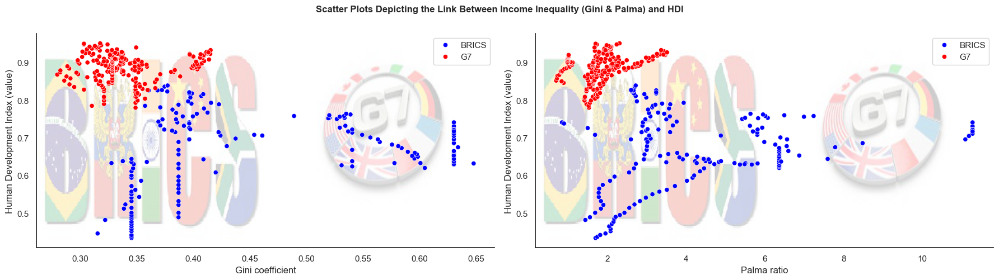

In [83]:
#plotting scatter plot to visualize the relationship of income inequality and HDI

#creating subplots
fig, ax = plt.subplots(nrows=1, ncols=2, figsize= (18,5))

#plotting scatter plot of Gini coefficient vs HDI
sns.scatterplot(data=df_inequality_final, 
                x='Gini coefficient', 
                y='Human Development Index (value)', 
                hue='Country Group', 
                palette=['blue','red'], 
                ax=ax[0])
ax[0].legend()
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
#displaying background image
ax[0].imshow(brics_g7_image, 
             extent=ax[0].get_xlim() + ax[0].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)

###########################################################################################################################################

#plotting scatter plot of Gini coefficient vs HDI
sns.scatterplot(data=df_inequality_final, 
                x='Palma ratio', 
                y='Human Development Index (value)', 
                hue='Country Group', 
                palette=['blue','red'], 
                ax=ax[1])
ax[1].legend()
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
#displaying background image
ax[1].imshow(brics_g7_image, 
             extent=ax[1].get_xlim() + ax[1].get_ylim(), 
             aspect='auto', 
             zorder=-1, 
             alpha = 0.2)

#setting main title
plt.suptitle('Scatter Plots Depicting the Link Between Income Inequality (Gini & Palma) and HDI',
             fontsize=12, 
             fontweight='bold',
             y=1)

#adjusting spacing of subplots
plt.tight_layout()

**Key Takeaways**

- The visualized distributions indicate that the data is not normally distributed.

- Both the scatter plots and boxplots reveal a significant number of outliers.

- The scatter plots display a monotonic relationship, although it is not perfectly linear.

- Given these observations, performing a Spearman rank correlation is the appropriate approach.

## 6.2. Correlation heatmap - Spearman Correlation

Text(0.5, 1, 'Analyzing the Spearman Correlation Between Income Inequality (Gini Coefficient & Palma Ratio) and HDI')

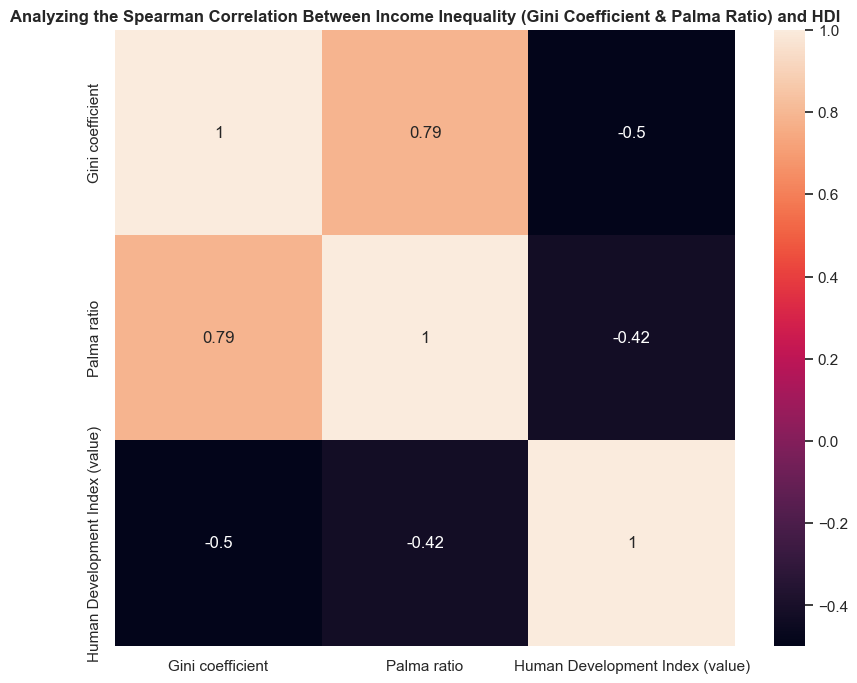

In [84]:
#plotting correlation heatmap
sns.heatmap(df_inequality_final[['Gini coefficient', 
                                 'Palma ratio',
                                 'Human Development Index (value)']].corr(method='spearman'), 
            annot=True)
plt.title('Analyzing the Spearman Correlation Between Income Inequality (Gini Coefficient & Palma Ratio) and HDI',
          fontweight='bold', 
          fontsize=12,
          y=1)

## 6.3. Calculating Spearman's Correlation Coefficient and P-Value

### 6.3.1. Hypothesis

Null Hypothesis (H0): Income inequality does not negatively impact human development.

Alternative Hypothesis (H1): Income inequality negatively impacts human development.

### 6.3.2. Gini coefficient and HDI correlation

In [85]:
corr, pval = spearmanr(df_inequality_final['Gini coefficient'], df_inequality_final['Human Development Index (value)'])

print('Correlation coefficient')
print(corr)
print('_____________________________')
print('p-value')
print(pval)
if pval < 0.05:
    print('Statistically significant')

Correlation coefficient
-0.49806071507778676
_____________________________
p-value
3.243019221597852e-26
Statistically significant


### 6.3.3. Palma ratio and HDI correlation

In [86]:
corr, pval = spearmanr(df_inequality_final['Palma ratio'], df_inequality_final['Human Development Index (value)'])

print('Correlation coefficient')
print(corr)
print('_____________________________')
print('p-value')
print(pval)
if pval < 0.05:
    print('Statistically significant')

Correlation coefficient
-0.4226648842735942
_____________________________
p-value
1.3662845363383802e-18
Statistically significant


# 7. Conclusion

Our analysis, using the Spearman correlation, reveals a moderate negative correlation between income inequality and the Human Development Index (HDI). With p-values less than 0.05, we have statistically significant evidence that higher levels of income inequality correspond to lower levels of human development. In simpler terms, as income inequality rises, a country's human development tends to decline, leading us to reject the null hypothesis.

This finding is critical for policymakers and government officials. It highlights the importance of addressing income inequality to promote better health outcomes, educational attainment, and overall well-being for the population. Governments should prioritize creating and implementing policies that mitigate income disparities, such as improving access to quality education and healthcare, ensuring fair wages, and fostering economic opportunities for all citizens. By doing so, they can enhance human development and achieve more equitable and sustainable growth for their nations.
